In [80]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from sklearn.metrics import auc

import os
import glob
import pickle as pkl

In [81]:
# Experiment Mar11 with 4 feature selection methods
# Differences with the previous experiments:
# fixed a bug with feature extraction
# double-checked the LSN implementation
# added confusion matrices / heatmap
# added AIBL replication study

df = pd.read_csv("../results/Exp_Mar11/model_performance.csv")
choices = ["BL, CT", "BL+followup, CT", "BL, CT+CA","BL+followup, CT+CA"]
sns.set(font_scale=2)

# Reformat the obtained results
new_df = pd.DataFrame()
for index, row in df.iterrows():
    if row["Method"] != "LSN" and not row["NoThickness"]:
        if row["NoClinical"] and row["NoFollowup"]:
            condition = "BL, CT"
        elif row["NoClinical"]:
            condition = "BL+followup, CT"
        elif row["NoFollowup"]:
            condition = "BL, CT+CA"
        else:
            condition = "BL+followup, CT+CA"
        method = row["Method"]
        featuretype = row["FeatureType"]
        trajectory = row["Trajectory"]
        
        for i in range(10):
            accuracy = row["acc_{}".format(i)]
            my_auc = row["auc_{}".format(i)]
            new_row = {"Method": method, "Input Type": condition,
                       "FeatureType": featuretype, "Trajectory": trajectory,
                       "Balanced accuracy": accuracy, "AUC": my_auc}
            for sg in ["BE", "FE", "CC"]:
                new_row['Balanced accuracy ({})'.format(sg)] = row['acc_{}_{}'.format(sg, i)]
                new_row['AUC ({})'.format(sg)] = row['auc_{}_{}'.format(sg, i)]
            new_df = new_df.append(new_row, ignore_index=True)

# Append the results with the LSN method
for index, row in df.iterrows():
    if row["Method"] == "LSN":
        condition = "BL+followup, CT+CA"
        method = row["Method"]
        featuretype = row["FeatureType"]
        trajectory = row["Trajectory"]
        
        for i in range(10):
            accuracy = row["acc_{}".format(i)]
            my_auc = row["auc_{}".format(i)]
            new_row = {"Method": method, "Input Type": condition,
                       "FeatureType": featuretype, "Trajectory": trajectory,
                       "Balanced accuracy": accuracy, "AUC": my_auc}
            for sg in ["BE", "FE", "CC"]:
                new_row['Balanced accuracy ({})'.format(sg)] = row['acc_{}_{}'.format(sg, i)]
                new_row['AUC ({})'.format(sg)] = row['auc_{}_{}'.format(sg, i)]
            new_df = new_df.append(new_row, ignore_index=True)
            
# Append the results with clinical attributes only
for index, row in df.iterrows():
    if row["NoThickness"]:
        if row["NoFollowup"]:
            condition = "BL, CA"
        else:
            condition = "BL+followup, CA"
        method = row["Method"]
        featuretype = row["FeatureType"]
        trajectory = row["Trajectory"]
        
        for i in range(10):
            accuracy = row["acc_{}".format(i)]
            my_auc = row["auc_{}".format(i)]
            new_row = {"Method": method, "Input Type": condition,
                       "FeatureType": featuretype, "Trajectory": trajectory,
                       "Balanced accuracy": accuracy, "AUC": my_auc}
            for sg in ["BE", "FE", "CC"]:
                new_row['Balanced accuracy ({})'.format(sg)] = row['acc_{}_{}'.format(sg, i)]
                new_row['AUC ({})'.format(sg)] = row['auc_{}_{}'.format(sg, i)]
            new_df = new_df.append(new_row, ignore_index=True)

/opt/quarantine/anaconda/5.1.0-python3/install/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


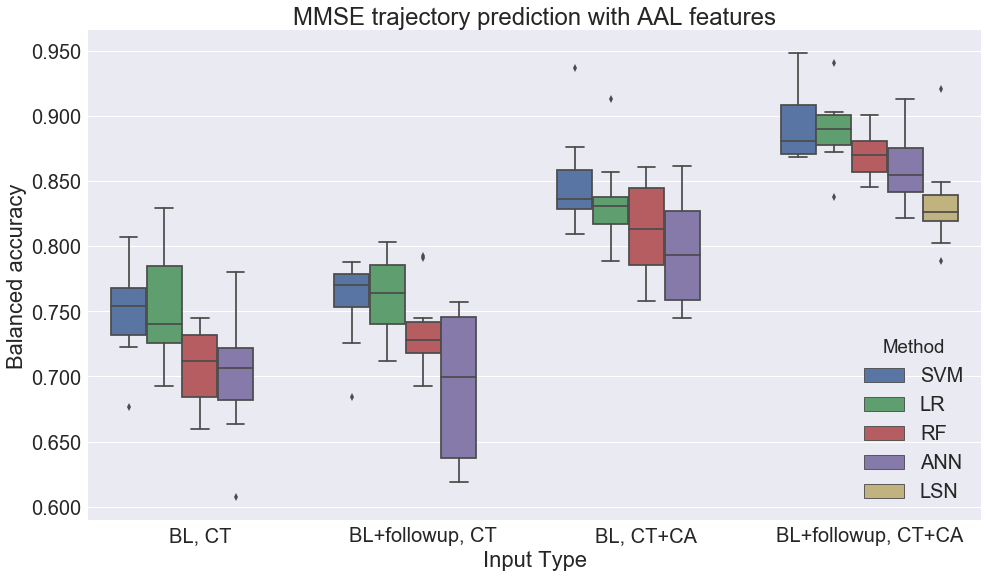

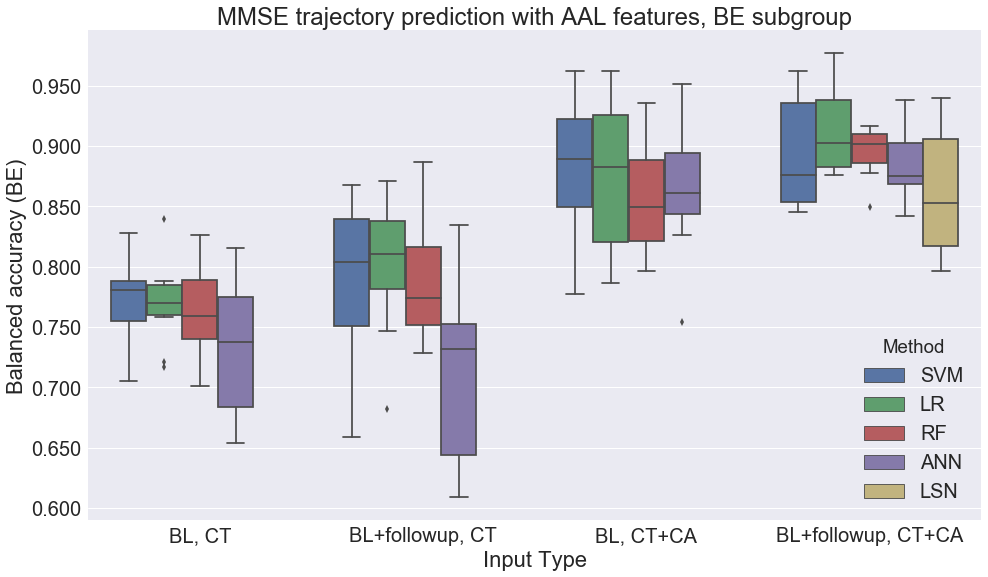

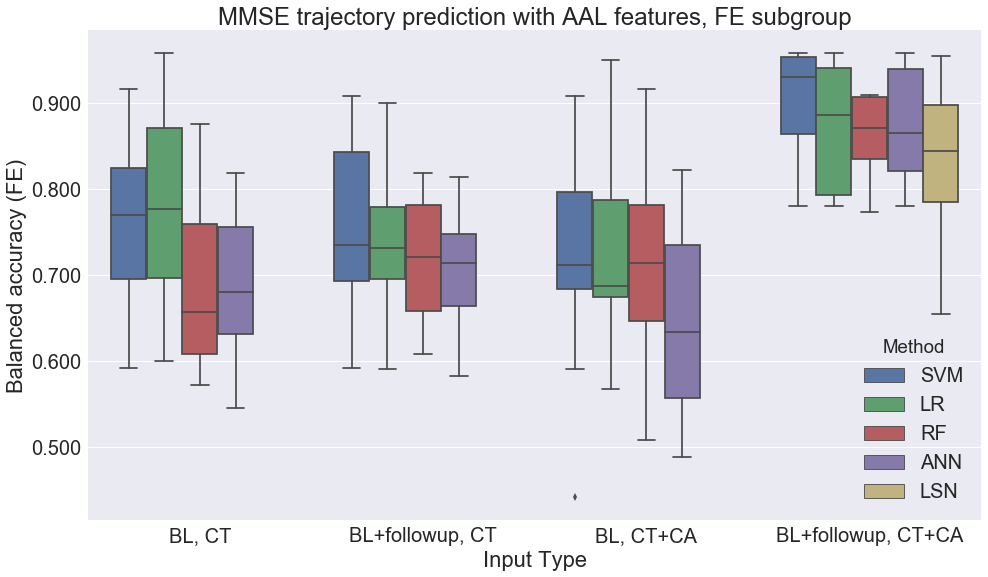

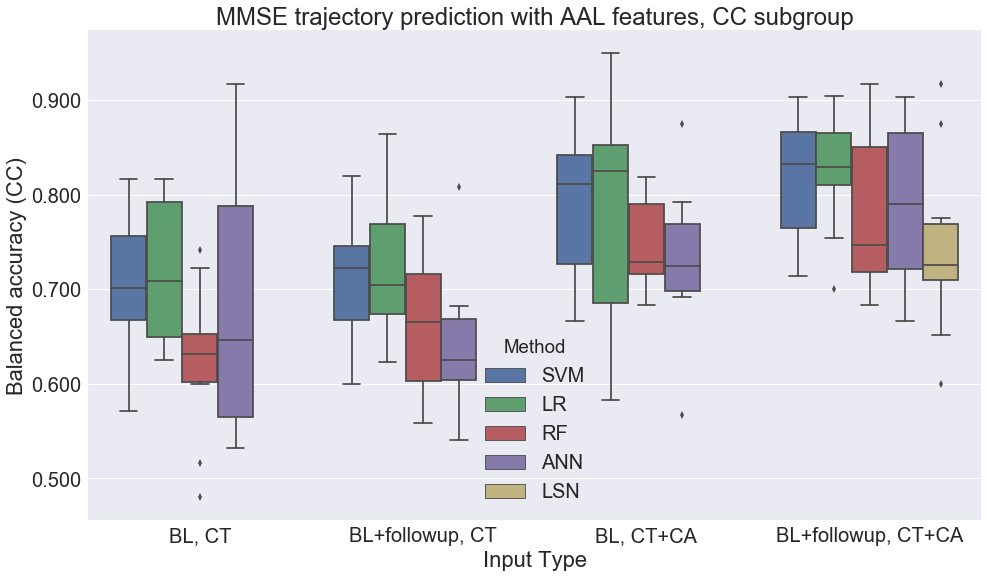

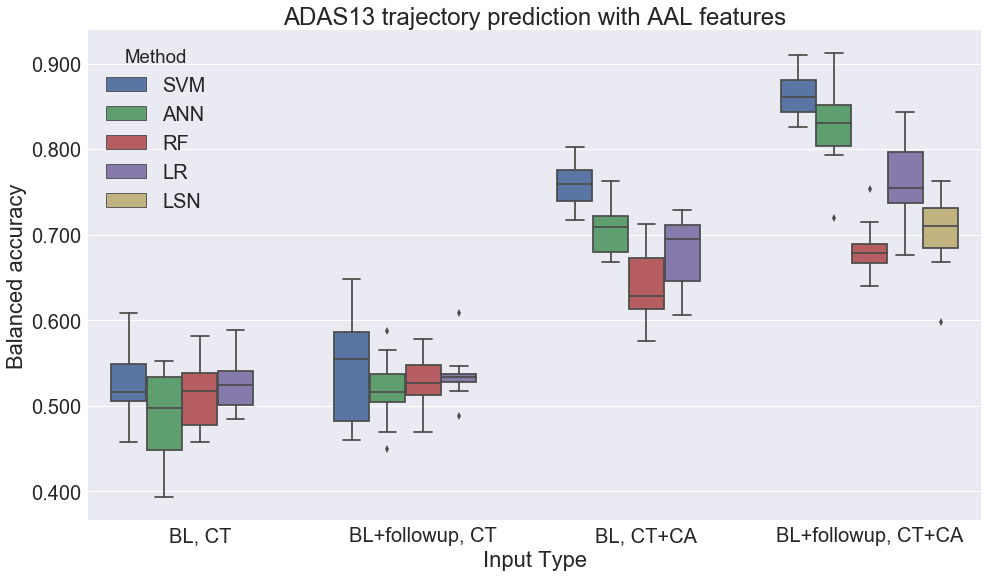

...

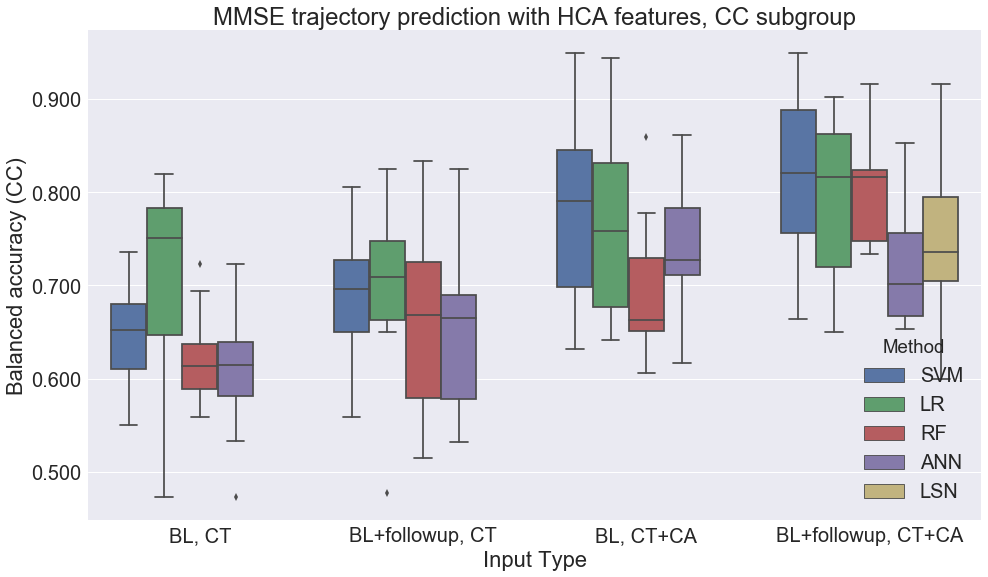

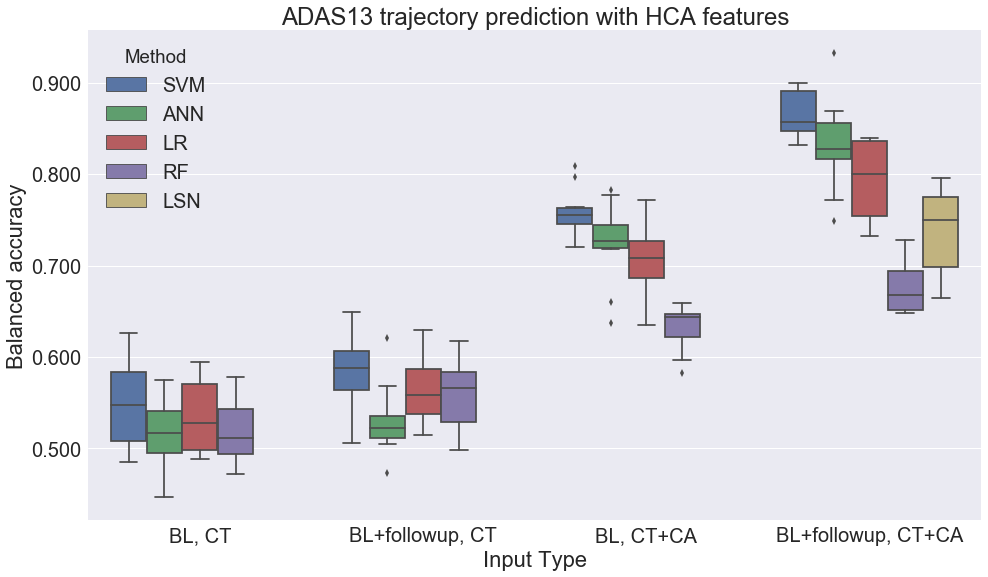

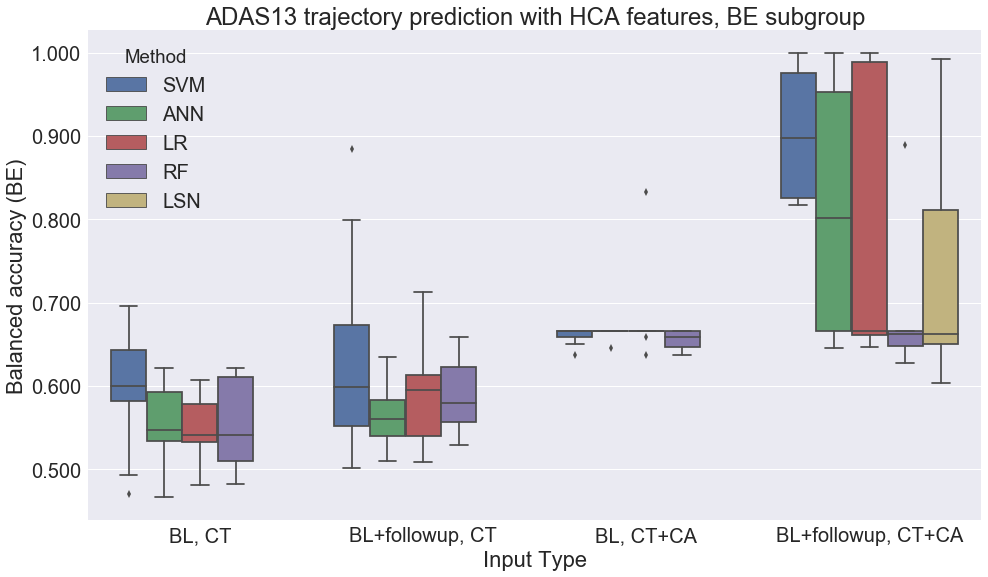

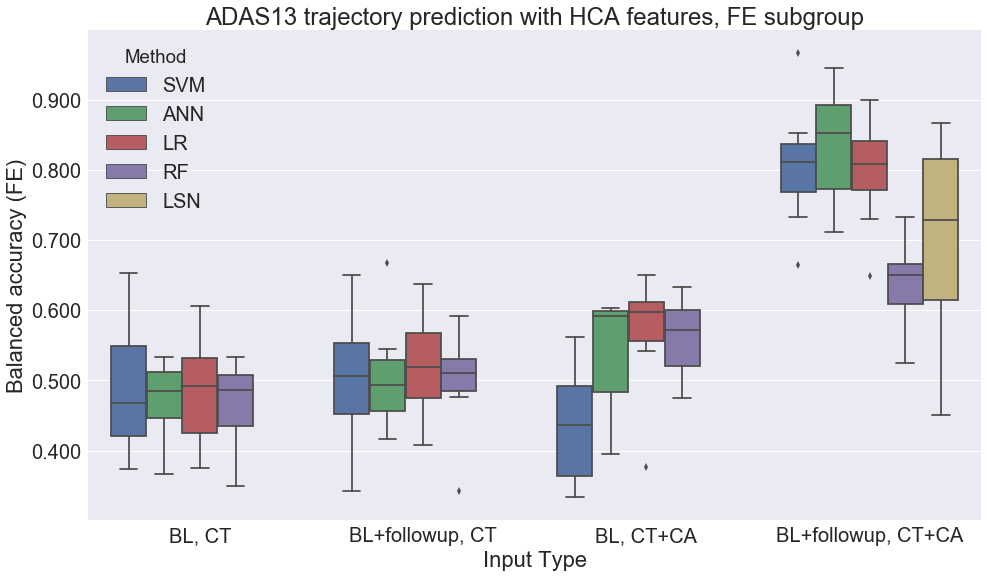

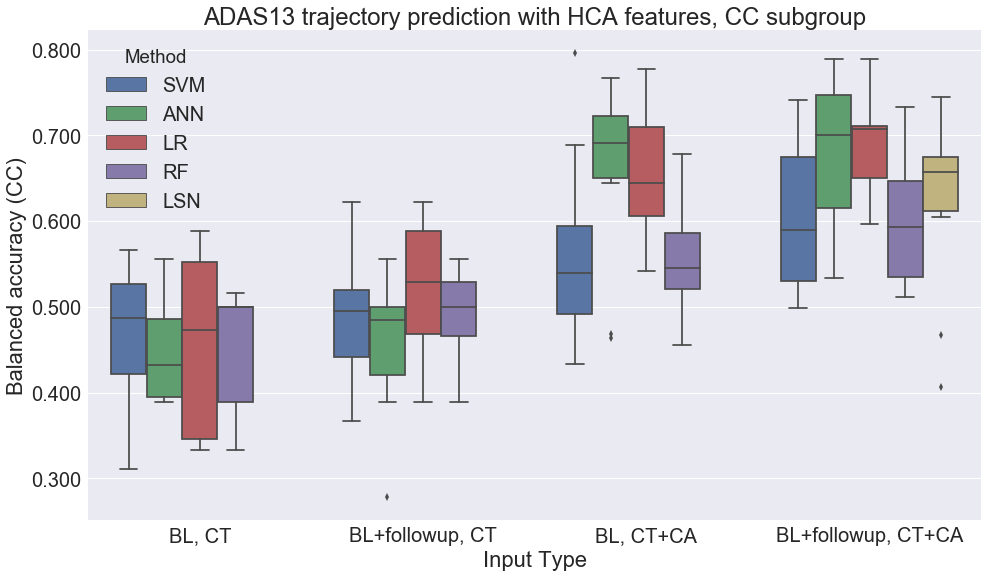

In [82]:
# Look through the experimental conditions (accuracy)
for f in ["AAL", "PCA", "RFE", "RLR", "HCA"]:
    for t in ["MMSE", "ADAS13"]:
        plt.figure(figsize=(16,9))
        cur_df = new_df.loc[(new_df["Trajectory"] == t) & (new_df["FeatureType"] == f)]
        ax = sns.boxplot(x="Input Type", y="Balanced accuracy", hue="Method", data=cur_df, order=choices)
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
        plt.title("{} trajectory prediction with {} features".format(t, f))
        plt.savefig("../plots/Exp_Mar11/{}_{}_acc_boxplot.png".format(t, f))
        
        for sg in ["BE", "FE", "CC"]:
            plt.figure(figsize=(16,9))
            ax = sns.boxplot(x="Input Type", y="Balanced accuracy ({})".format(sg), 
                             hue="Method", data=cur_df, order=choices)
            ax.yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
            plt.title("{} trajectory prediction with {} features, {} subgroup".format(t, f, sg))
            plt.savefig("../plots/Exp_Mar11/{}_{}_{}_acc_boxplot.png".format(t, f, sg))

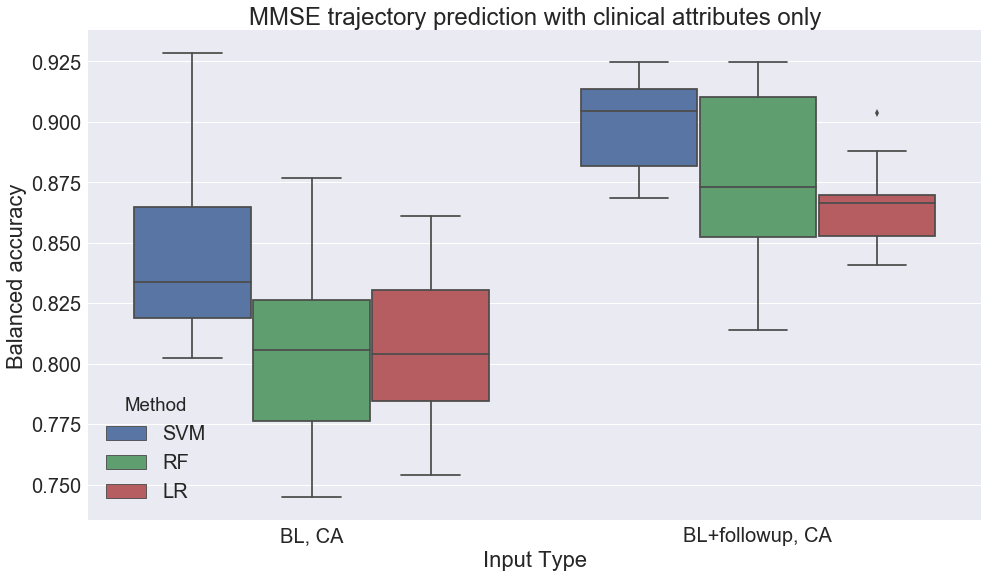

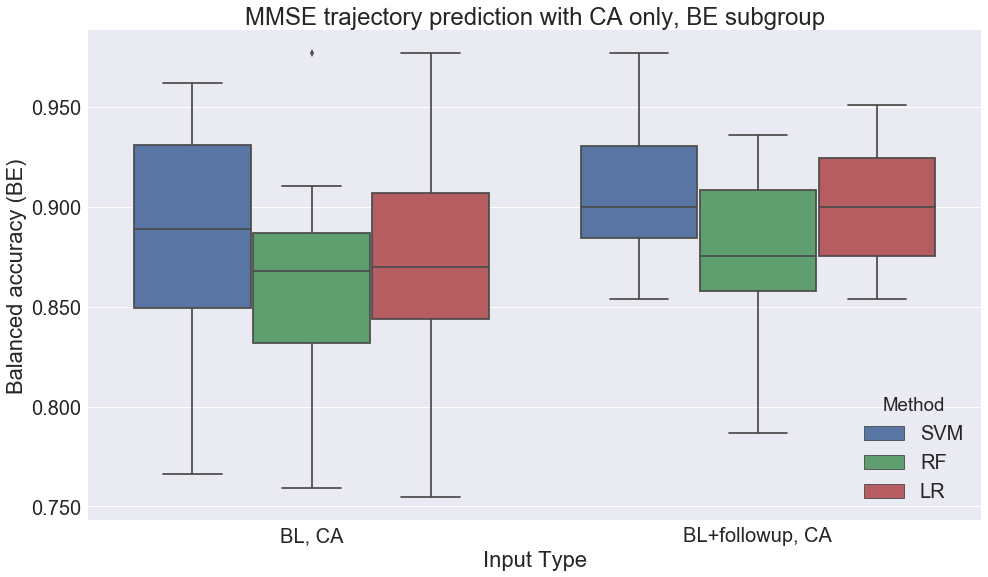

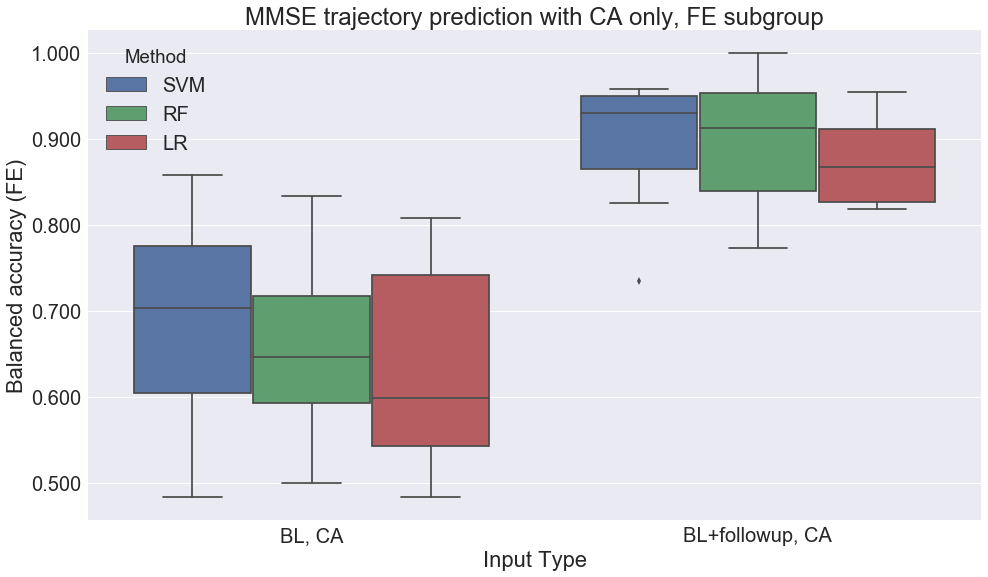

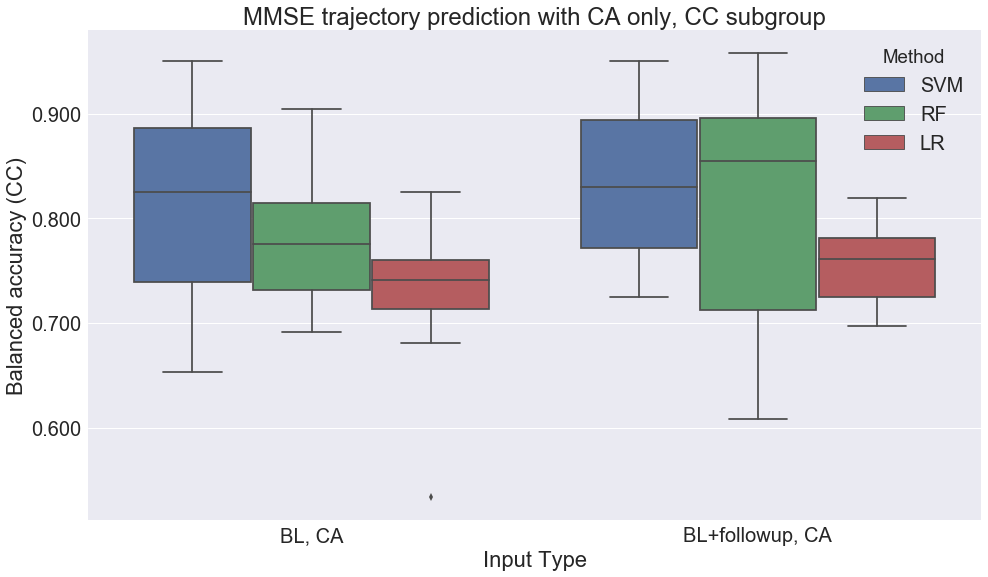

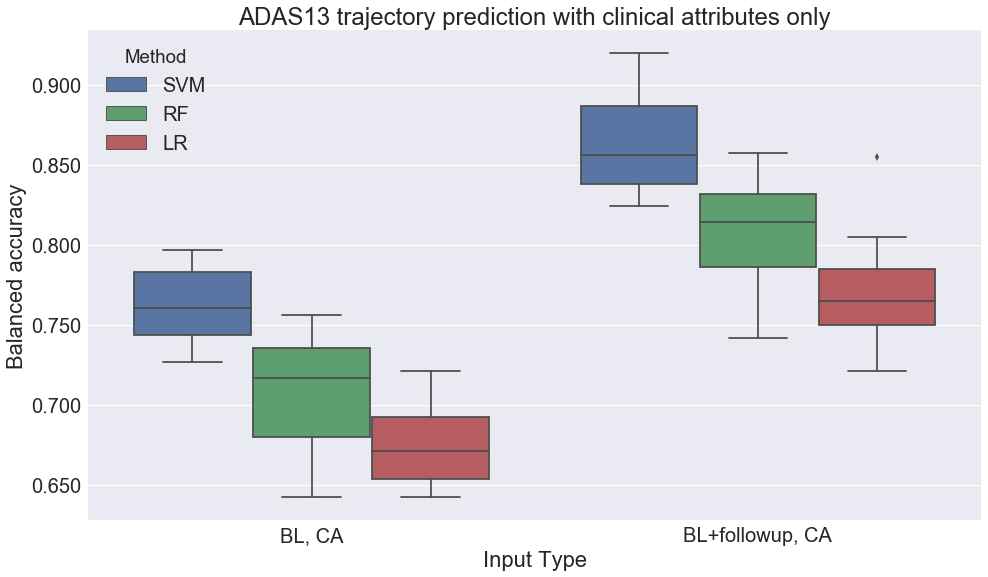

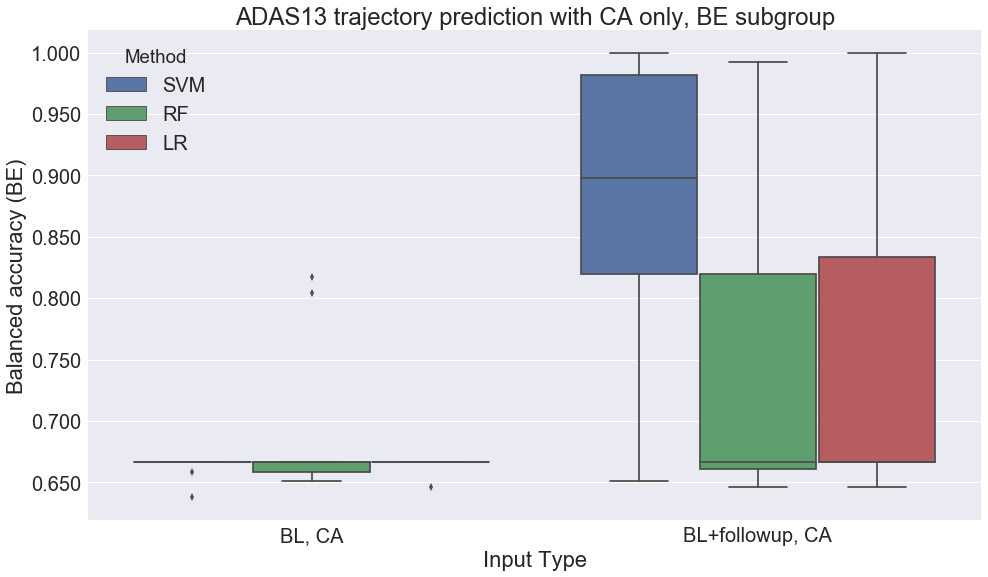

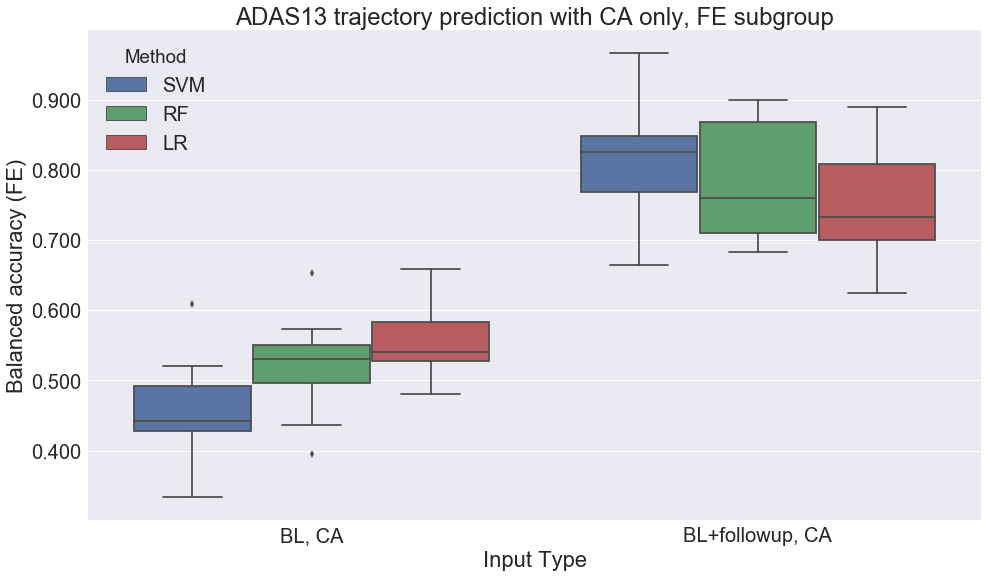

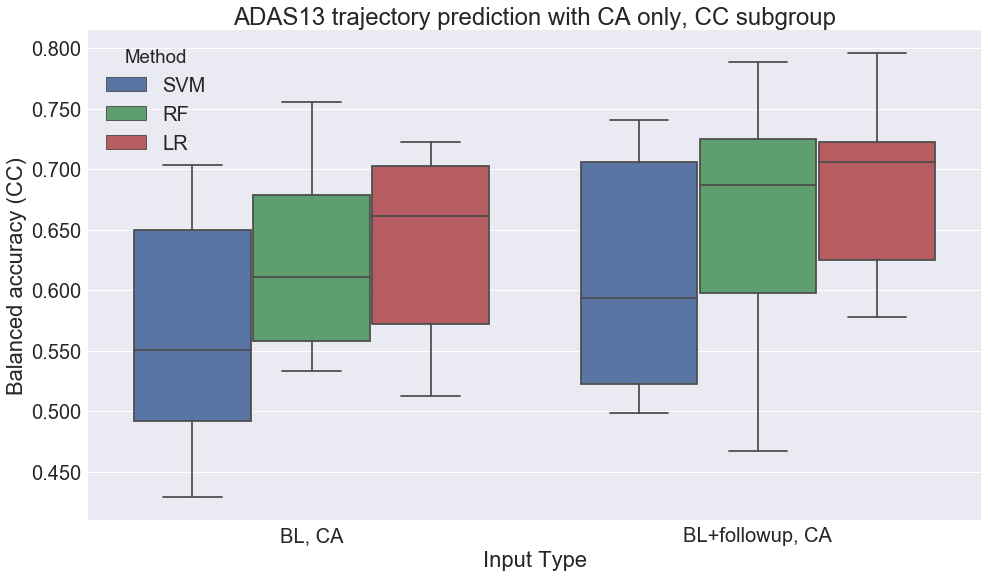

In [83]:
# Plot the accuracy with clinical attributes only
for t in ["MMSE", "ADAS13"]:
    plt.figure(figsize=(16,9))
    cur_df = new_df.loc[(new_df["Trajectory"] == t) & (new_df["FeatureType"] == "None")]
    ax = sns.boxplot(x="Input Type", y="Balanced accuracy", hue="Method", data=cur_df, 
                     order=["BL, CA", "BL+followup, CA"])
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
    plt.title("{} trajectory prediction with clinical attributes only".format(t))
    plt.savefig("../plots/Exp_Mar11/{}_CA-only_acc_boxplot.png".format(t))
    
    for sg in ["BE", "FE", "CC"]:
        plt.figure(figsize=(16,9))
        ax = sns.boxplot(x="Input Type", y="Balanced accuracy ({})".format(sg), hue="Method", 
                         data=cur_df, order=["BL, CA", "BL+followup, CA"])
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
        plt.title("{} trajectory prediction with CA only, {} subgroup".format(t, sg))
        plt.savefig("../plots/Exp_Mar11/{}_{}_CA-only_acc_boxplot.png".format(t, sg))

/opt/quarantine/anaconda/5.1.0-python3/install/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


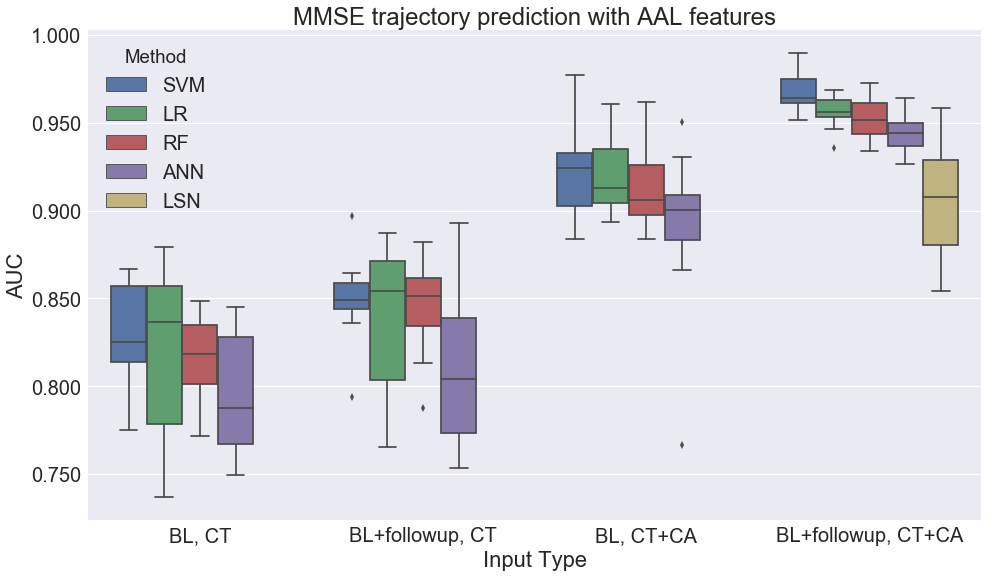

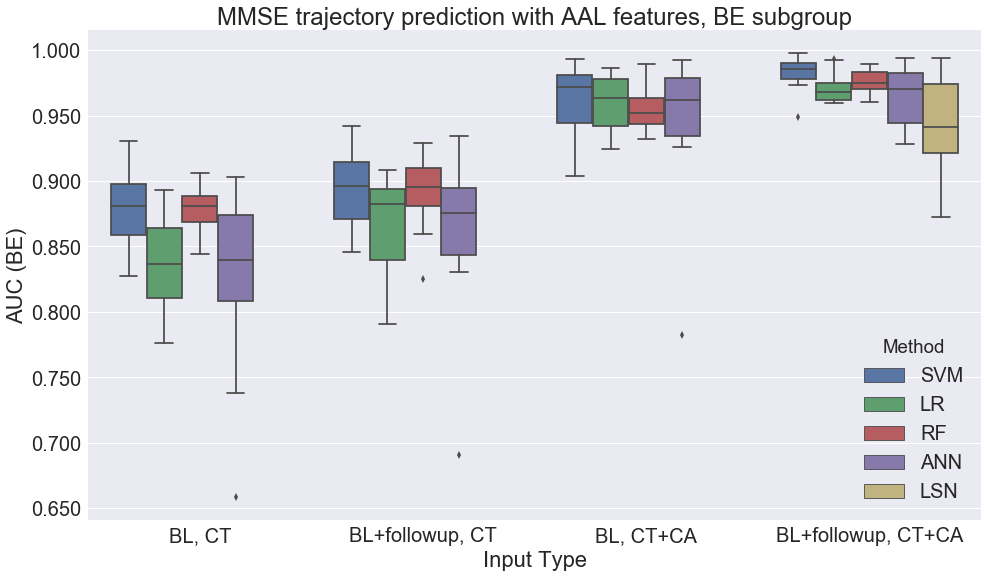

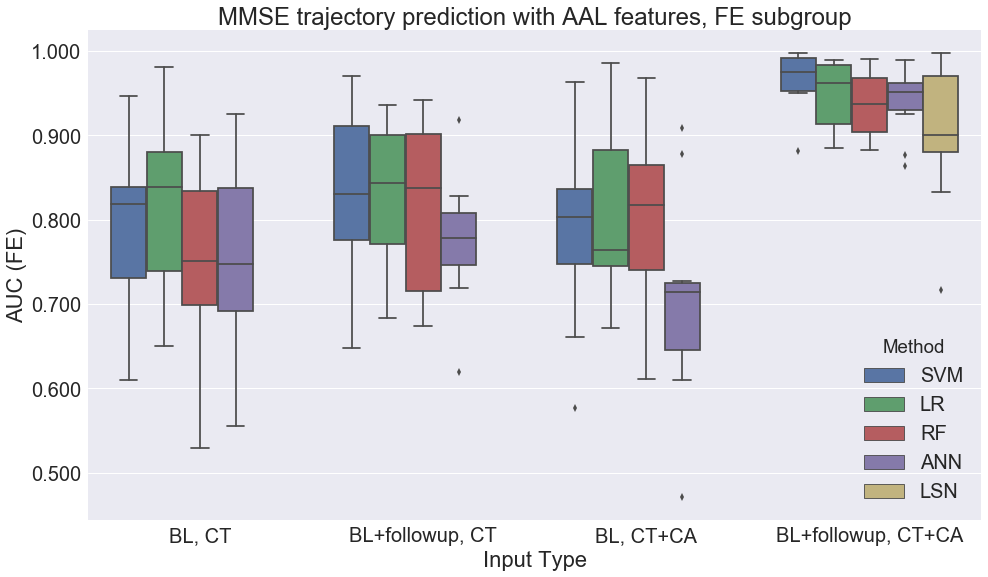

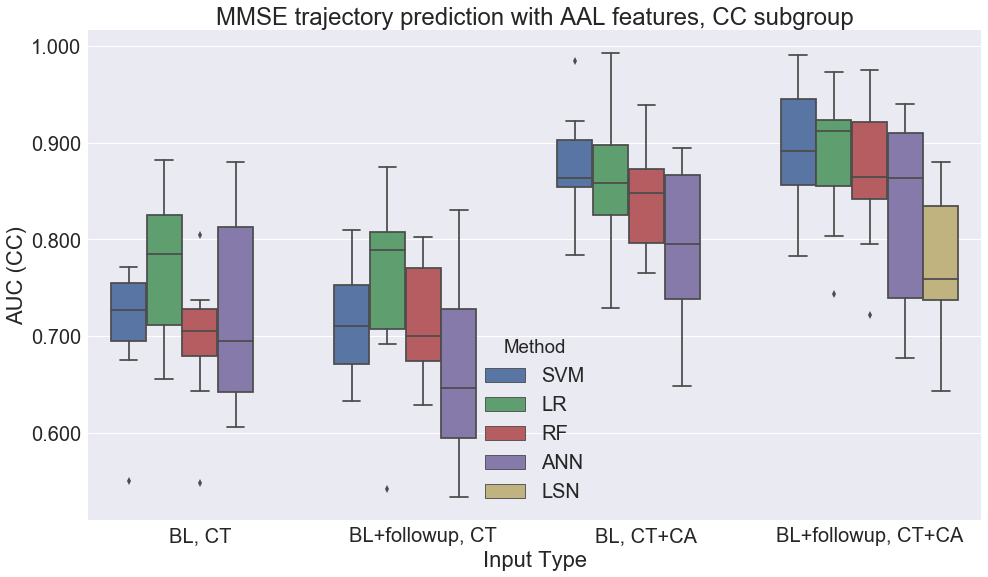

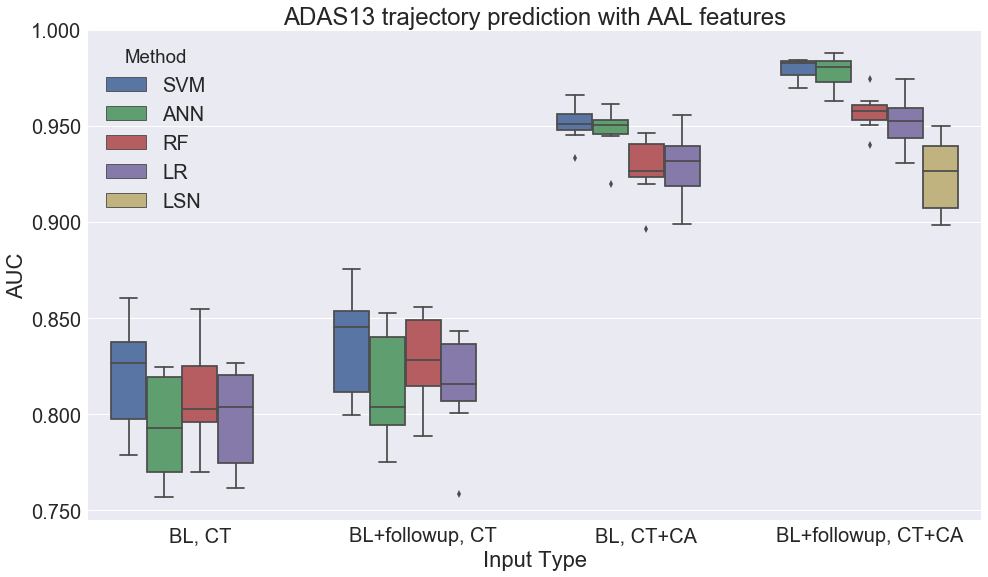

...

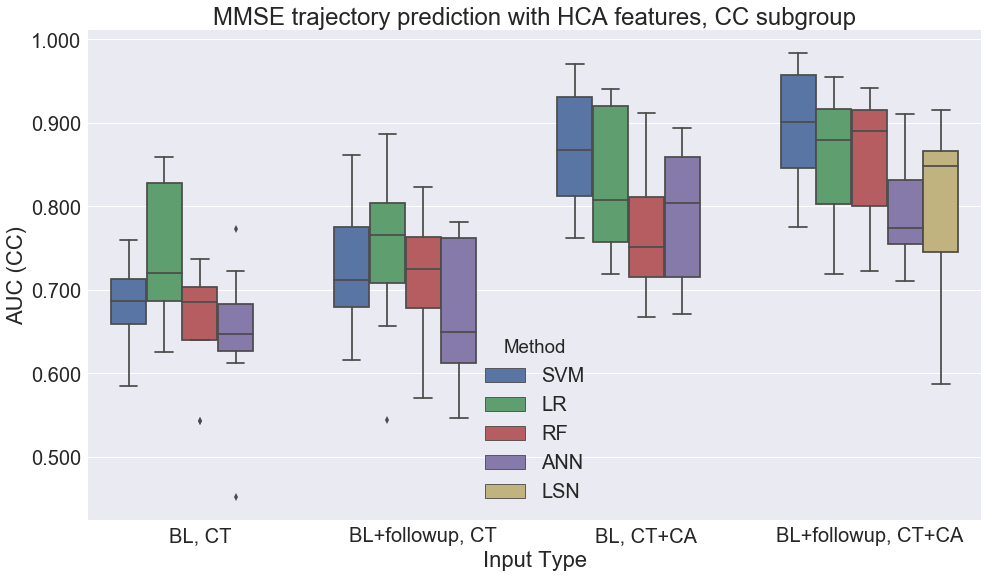

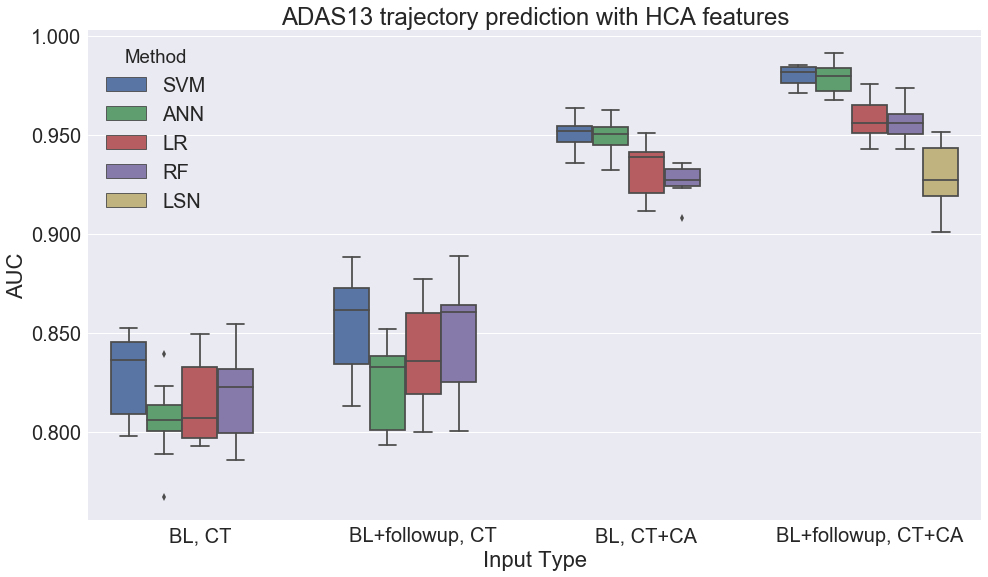

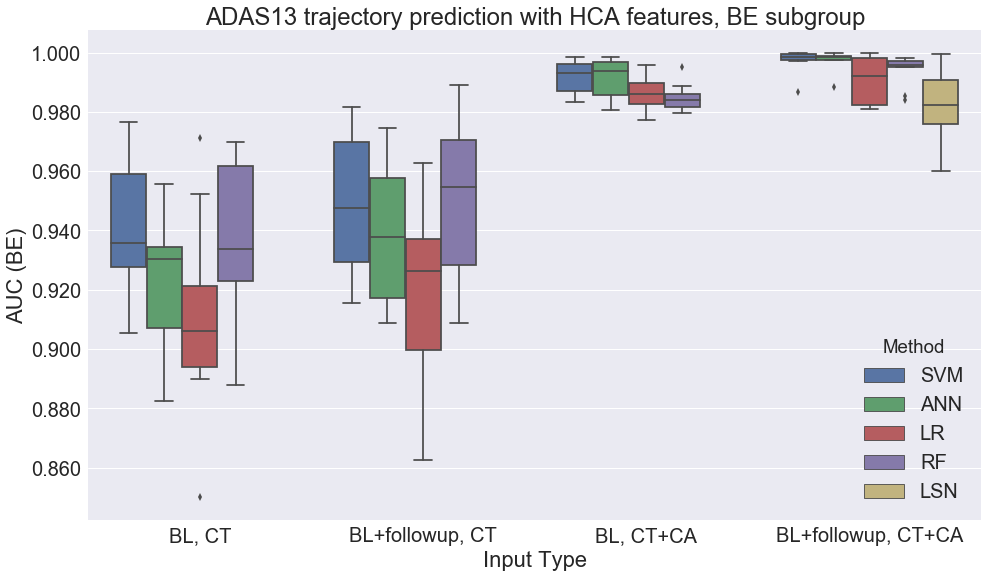

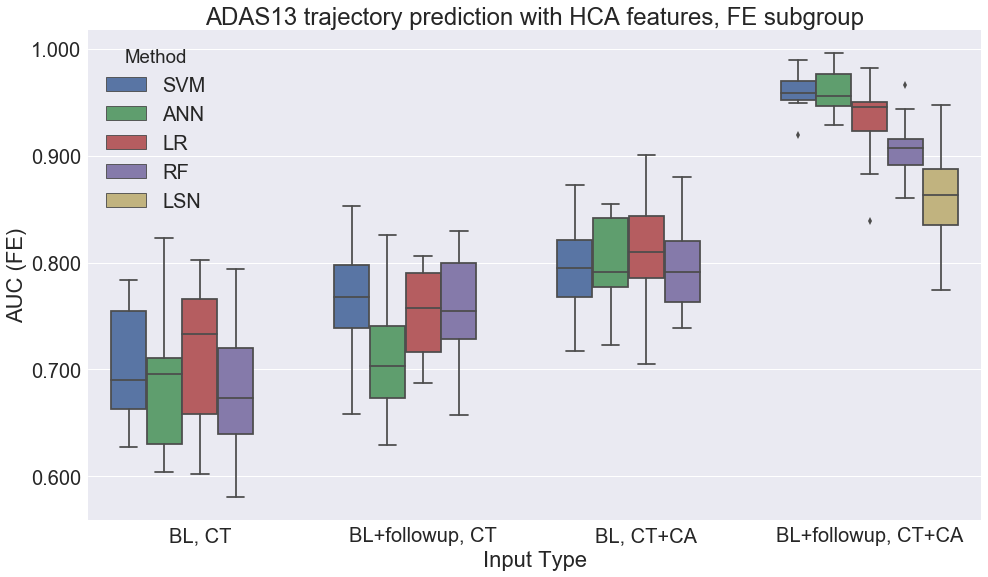

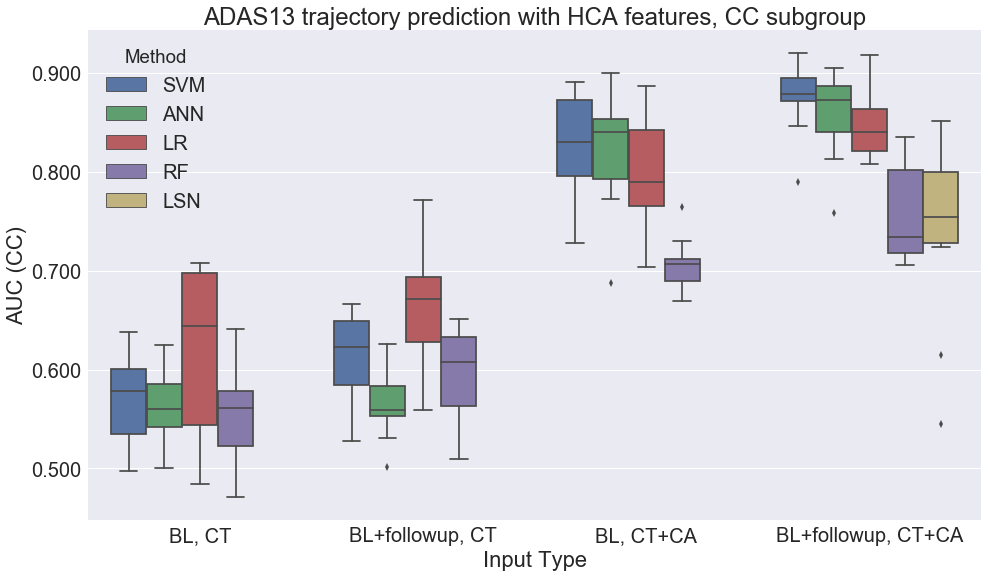

In [84]:
# Look through the experimental conditions (AUC)
for f in ["AAL", "PCA", "RFE", "RLR", "HCA"]:
    for t in ["MMSE", "ADAS13"]:
        plt.figure(figsize=(16,9))
        cur_df = new_df.loc[(new_df["Trajectory"] == t) & (new_df["FeatureType"] == f)]
        ax = sns.boxplot(x="Input Type", y="AUC", hue="Method", data=cur_df, order=choices)
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
        plt.title("{} trajectory prediction with {} features".format(t, f))
        plt.savefig("../plots/Exp_Mar11/{}_{}_auc_boxplot.png".format(t, f))
        
        for sg in ["BE", "FE", "CC"]:
            plt.figure(figsize=(16,9))
            ax = sns.boxplot(x="Input Type", y="AUC ({})".format(sg), 
                             hue="Method", data=cur_df, order=choices)
            ax.yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
            plt.title("{} trajectory prediction with {} features, {} subgroup".format(t, f, sg))
            plt.savefig("../plots/Exp_Mar11/{}_{}_{}_auc_boxplot.png".format(t, f, sg))

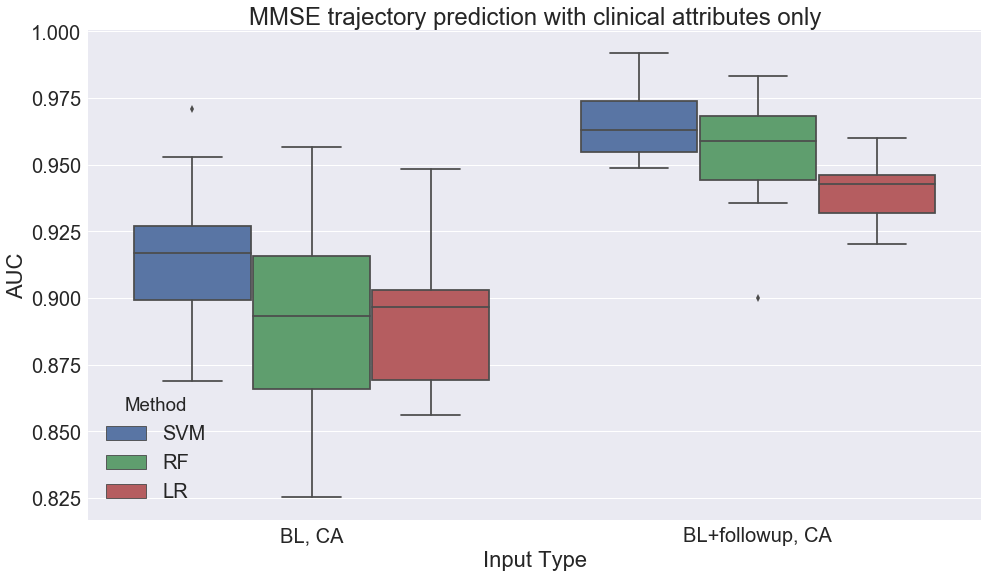

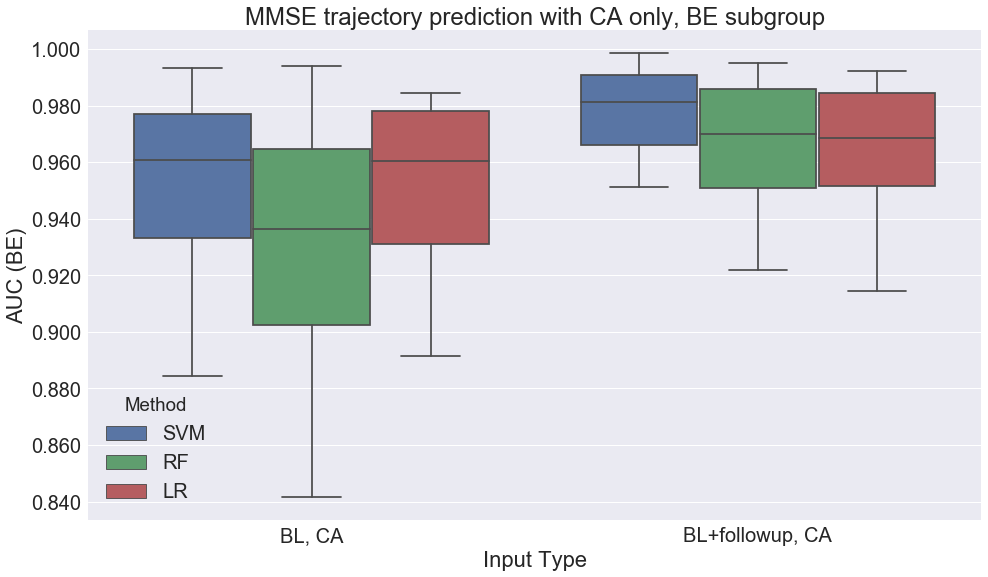

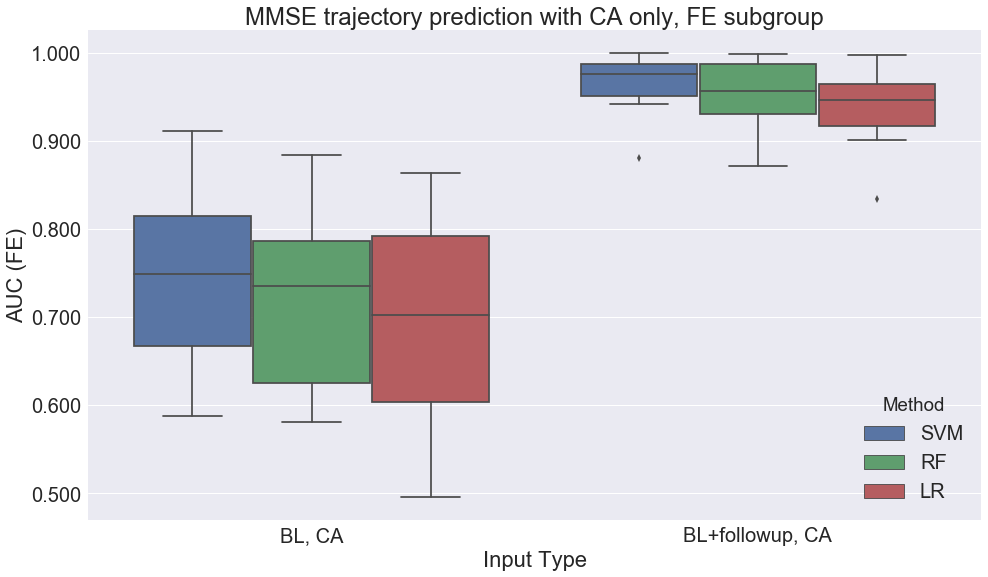

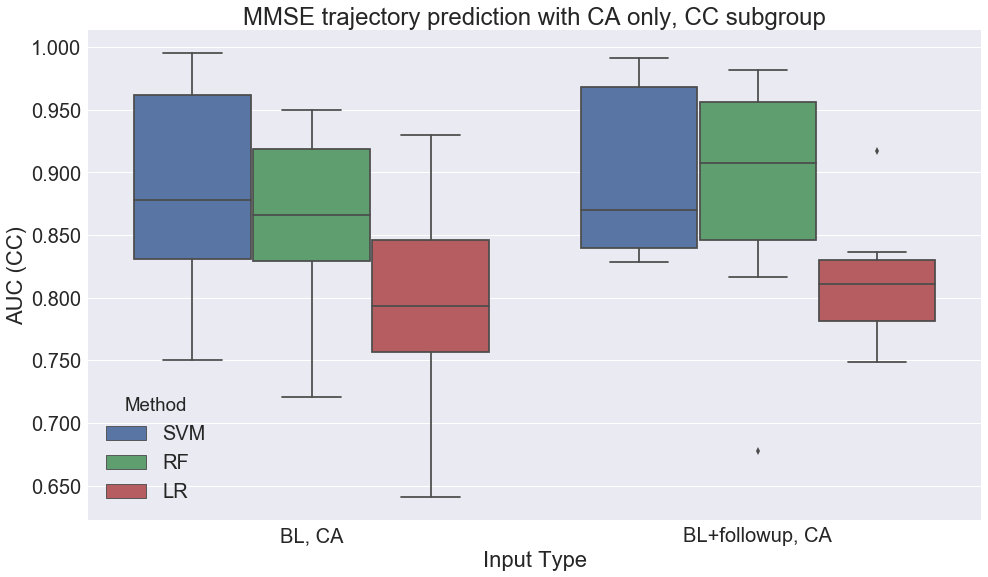

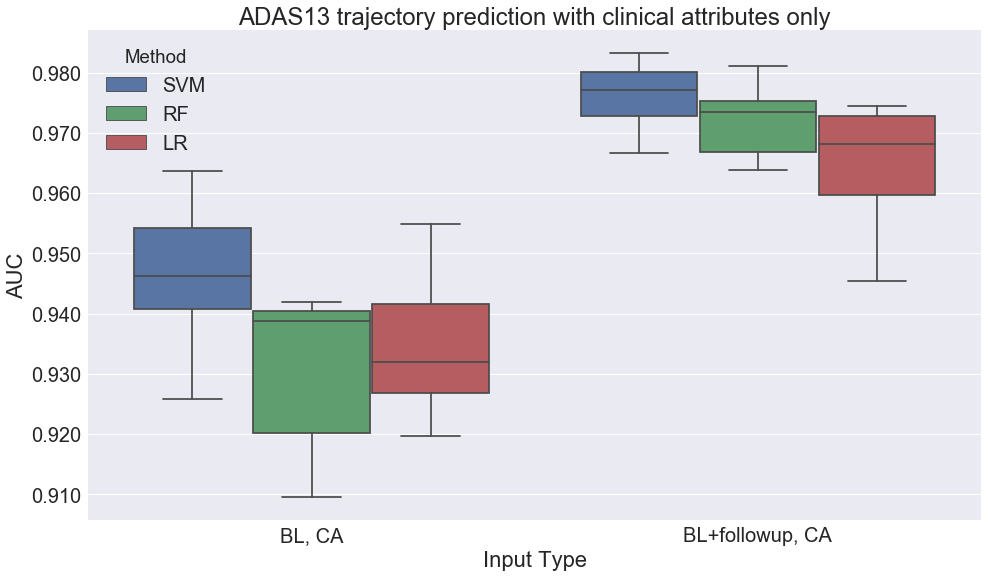

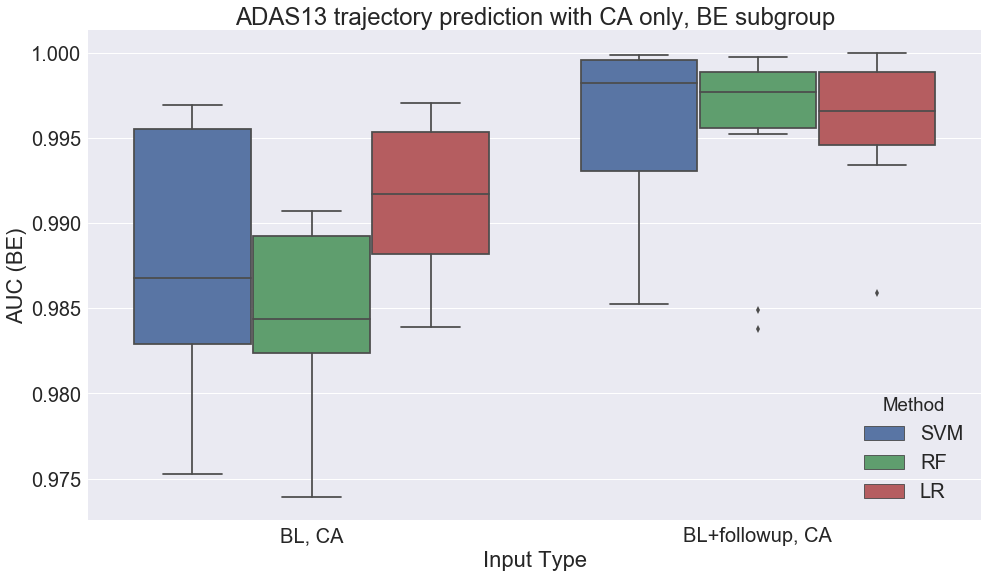

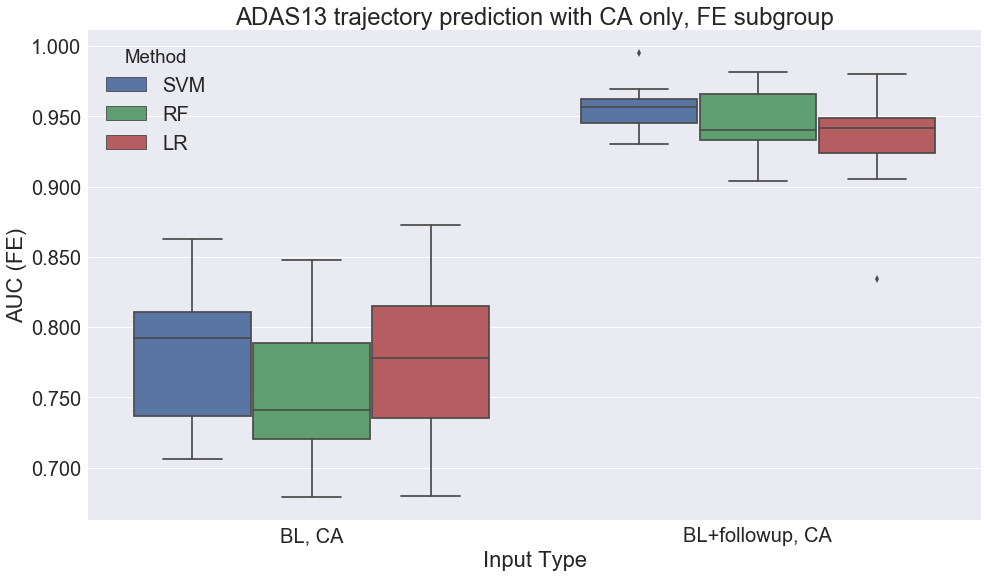

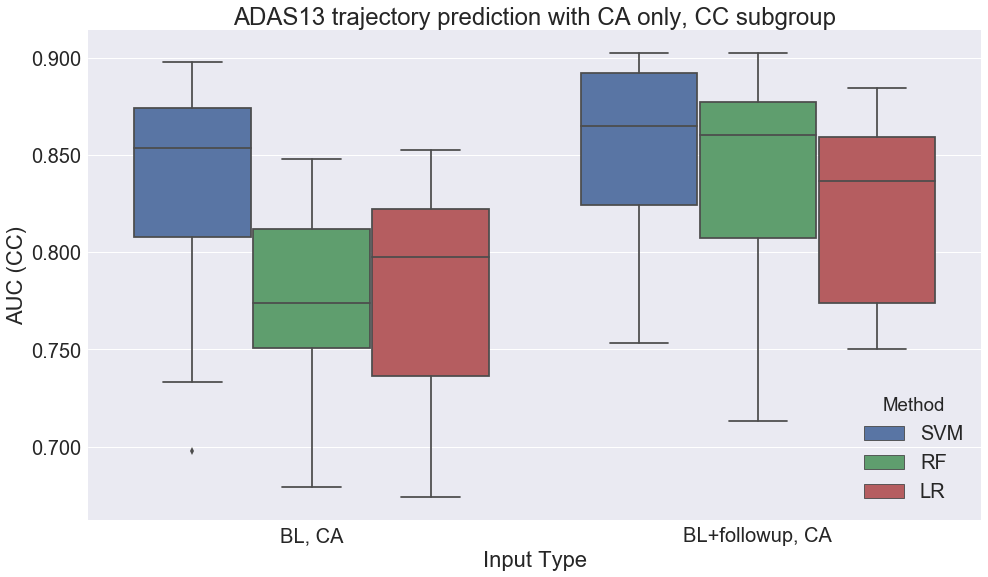

In [85]:
# Plot the AUC with clinical attributes only
for t in ["MMSE", "ADAS13"]:
    plt.figure(figsize=(16,9))
    cur_df = new_df.loc[(new_df["Trajectory"] == t) & (new_df["FeatureType"] == "None")]
    ax = sns.boxplot(x="Input Type", y="AUC", hue="Method", data=cur_df, 
                     order=["BL, CA", "BL+followup, CA"])
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
    plt.title("{} trajectory prediction with clinical attributes only".format(t))
    plt.savefig("../plots/Exp_Mar11/{}_CA-only_auc_boxplot.png".format(t))
    
    for sg in ["BE", "FE", "CC"]:
        plt.figure(figsize=(16,9))
        ax = sns.boxplot(x="Input Type", y="AUC ({})".format(sg), hue="Method", 
                         data=cur_df, order=["BL, CA", "BL+followup, CA"])
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
        plt.title("{} trajectory prediction with CA only, {} subgroup".format(t, sg))
        plt.savefig("../plots/Exp_Mar11/{}_{}_CA-only_auc_boxplot.png".format(t, sg))

/opt/quarantine/anaconda/5.1.0-python3/install/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


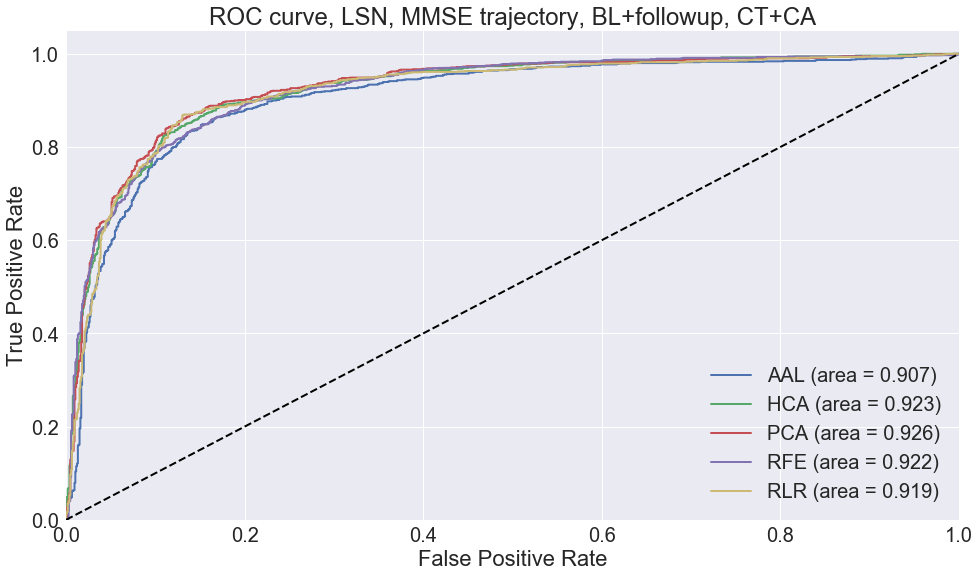

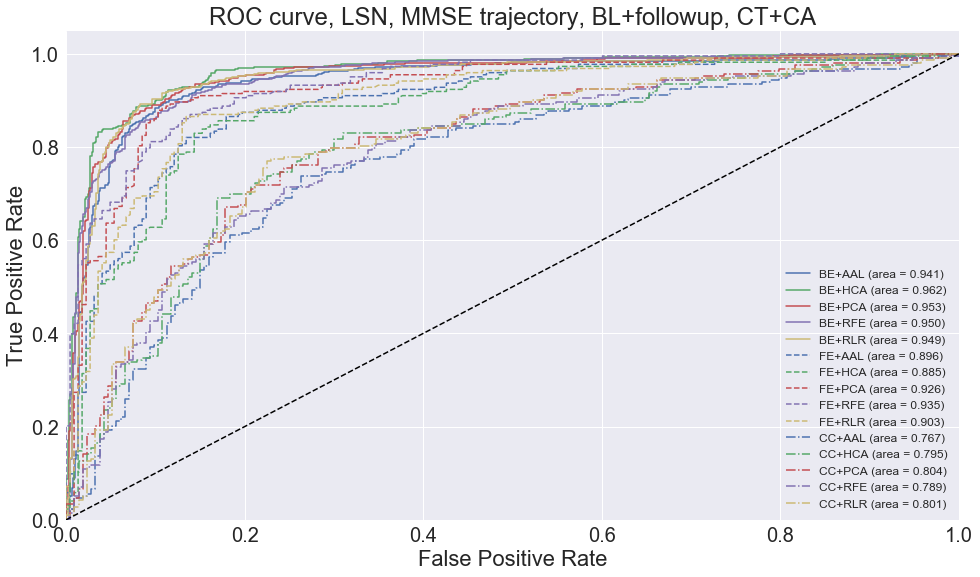

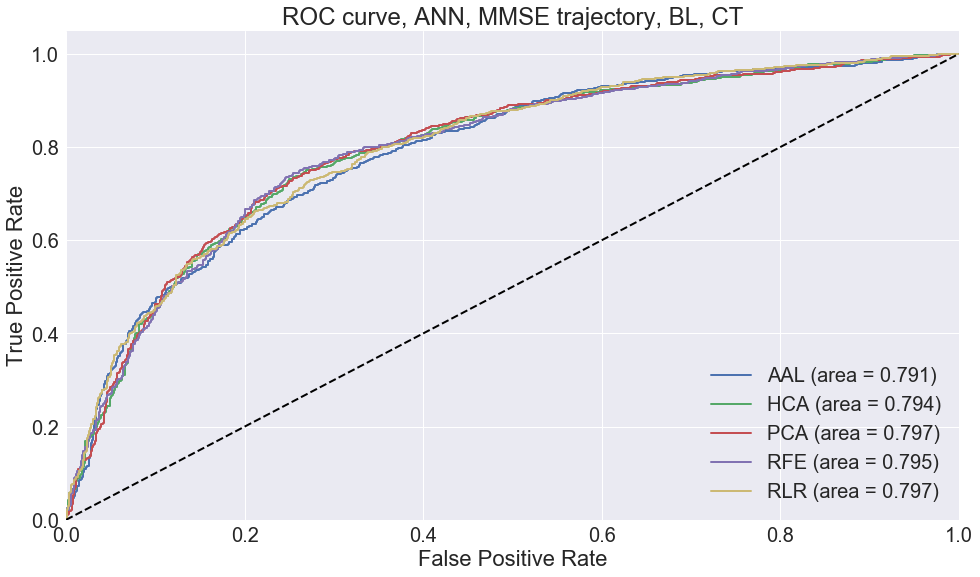

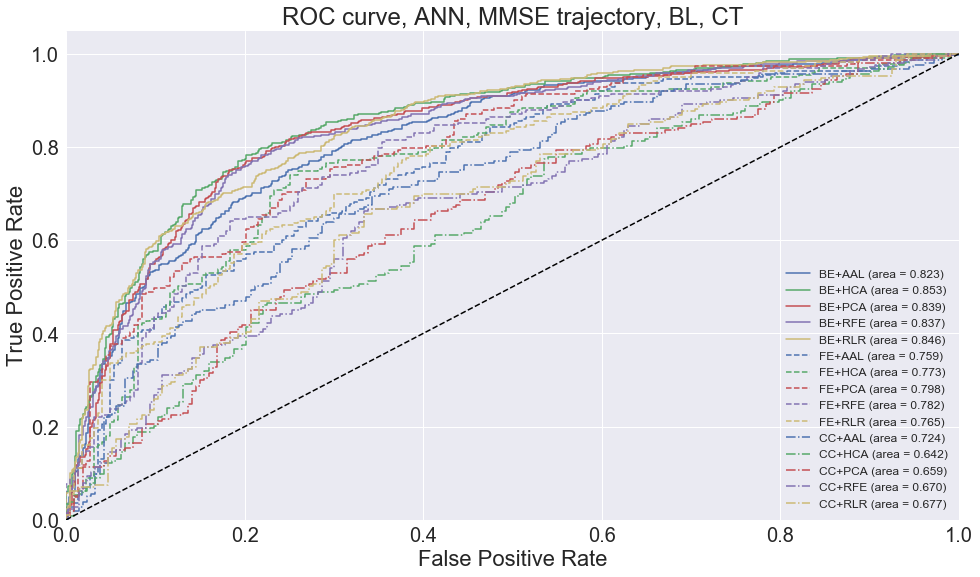

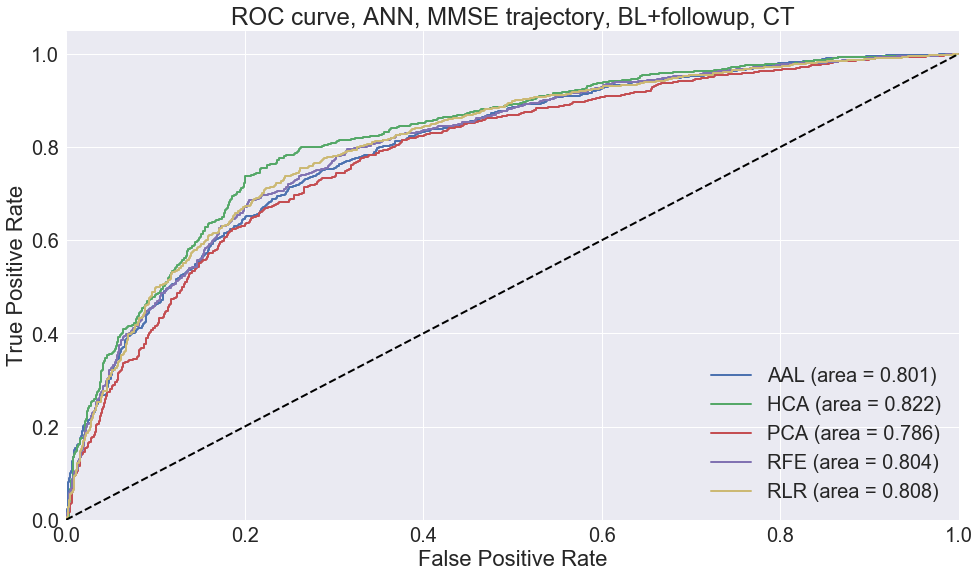

...

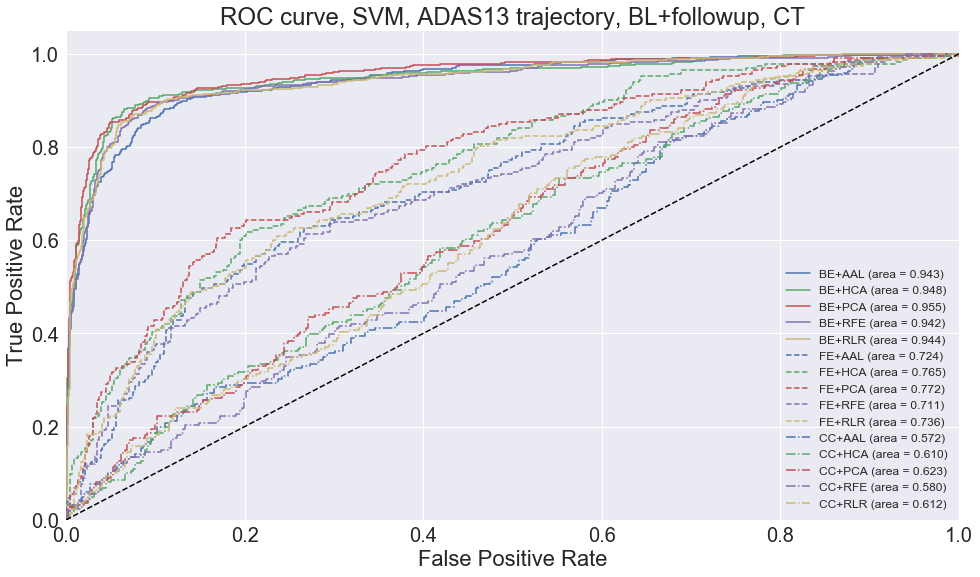

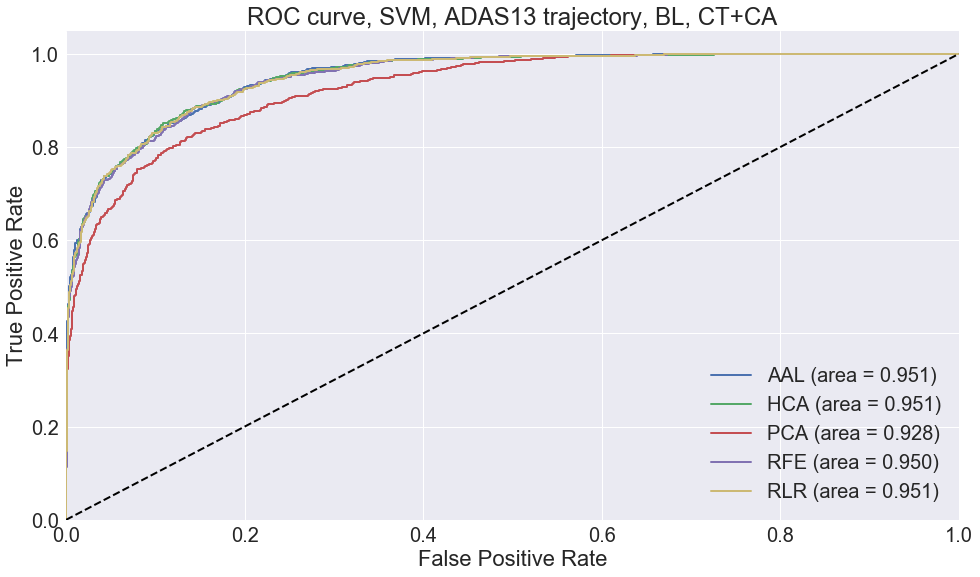

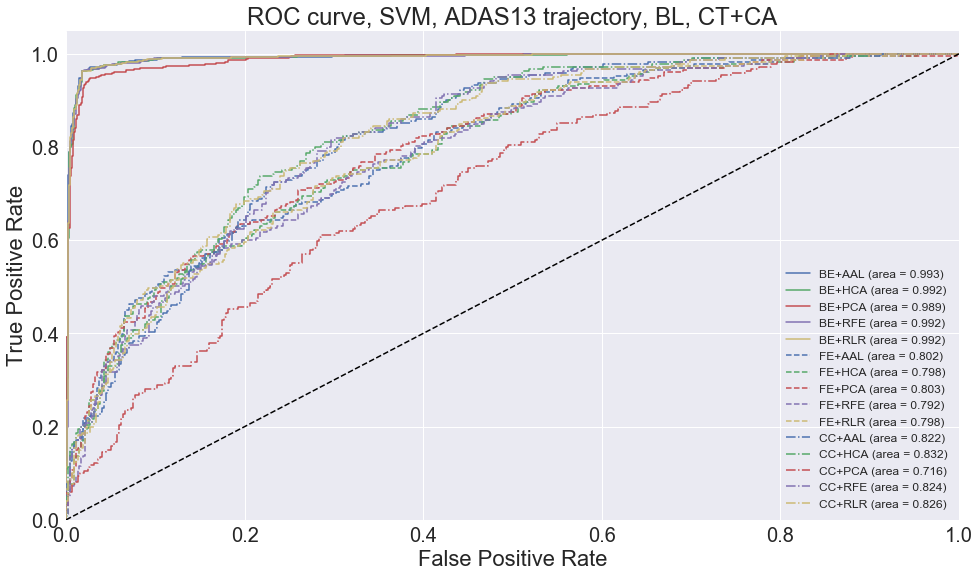

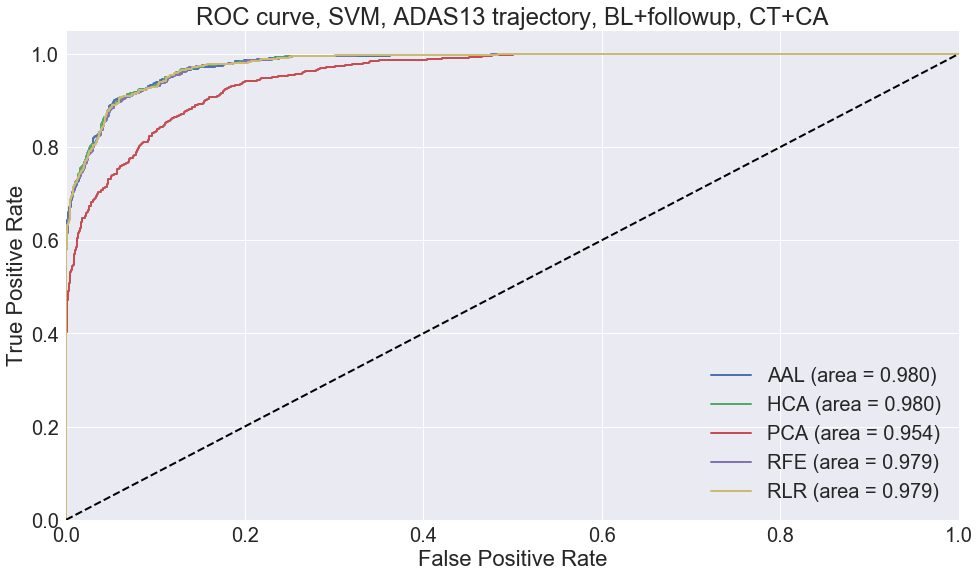

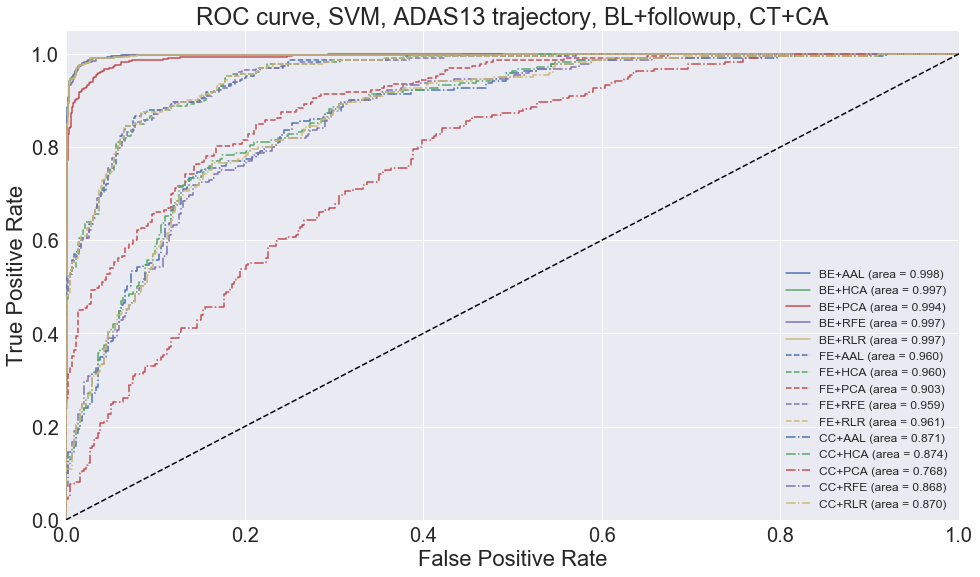

In [86]:
# Plot the Receiver Operator Characteristic curves

for t in ["MMSE", "ADAS13"]:
    for m in ["LSN", "ANN", "LR", "RF", "SVM"]:
        for ix, condition in enumerate(["BL, CT", "BL+followup, CT", "BL, CT+CA","BL+followup, CT+CA"]):
            if m == "LSN" and condition != "BL+followup, CT+CA":
                pass
        
            else:
                roc_stats = {}
            
                if condition == "BL, CT":
                    suffix = "{}_78_NoClinical_NoFollowup_roc_stats.pkl".format(t)
                elif condition == "BL+followup, CT":
                    suffix = "{}_78_NoClinical_roc_stats.pkl".format(t)
                elif condition == "BL, CT+CA":
                    suffix = "{}_78_NoFollowup_roc_stats.pkl".format(t)
                elif condition == "BL+followup, CT+CA":
                    suffix = "{}_78_roc_stats.pkl".format(t)

                for ftype in ["AAL", "HCA", "PCA", "RFE", "RLR"]:
                    with open("results/Exp_Mar11/{}_{}_{}".format(m, ftype, suffix), "rb") as f:
                        roc_stats[ftype] = pkl.load(f)

                plt.figure(figsize=(16,9))
                for ftype in ["AAL", "HCA", "PCA", "RFE", "RLR"]:
                    plt.plot(roc_stats[ftype]['fpr'], roc_stats[ftype]['tpr'],
                            lw=2, label="{} (area = {:0.3f})".format(ftype, 
                            auc(roc_stats[ftype]['fpr'], roc_stats[ftype]['tpr'])))

                plt.plot([0, 1], [0, 1], 'k--', lw=2)
                plt.xlim([0.0, 1.0])
                plt.ylim([0.0, 1.05])
                plt.xlabel('False Positive Rate')
                plt.ylabel('True Positive Rate')
                plt.title('ROC curve, {}, {} trajectory, {}'.format(m, t, condition))
                plt.legend(loc="lower right")
                plt.savefig("../plots/Exp_Mar11/{}_{}_{}_ROC_curve.png".format(m, t, ix))
                
                plt.figure(figsize=(16,9))
                colors = sns.color_palette()
                linestyles = ['-', '--', '-.']
                for i, sg in enumerate(["BE", "FE", "CC"]):
                    for j, ftype in enumerate(["AAL", "HCA", "PCA", "RFE", "RLR"]):
                        plt.plot(roc_stats[ftype]['fpr_{}'.format(sg)], roc_stats[ftype]['tpr_{}'.format(sg)],
                                lw=1.5, color=colors[j], linestyle=linestyles[i], 
                                label="{}+{} (area = {:0.3f})".format(sg, ftype, 
                                auc(roc_stats[ftype]['fpr_{}'.format(sg)], roc_stats[ftype]['tpr_{}'.format(sg)])))

                plt.plot([0, 1], [0, 1], 'k--', lw=1.5)
                plt.xlim([0.0, 1.0])
                plt.ylim([0.0, 1.05])
                plt.xlabel('False Positive Rate')
                plt.ylabel('True Positive Rate')
                plt.title('ROC curve, {}, {} trajectory, {}'.format(m, t, condition))
                plt.legend(loc="lower right", prop={'size': 12})
                plt.savefig("../plots/Exp_Mar11/{}_{}_{}_subgroup_ROC_curve.png".format(m, t, ix, sg))

/opt/quarantine/anaconda/5.1.0-python3/install/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


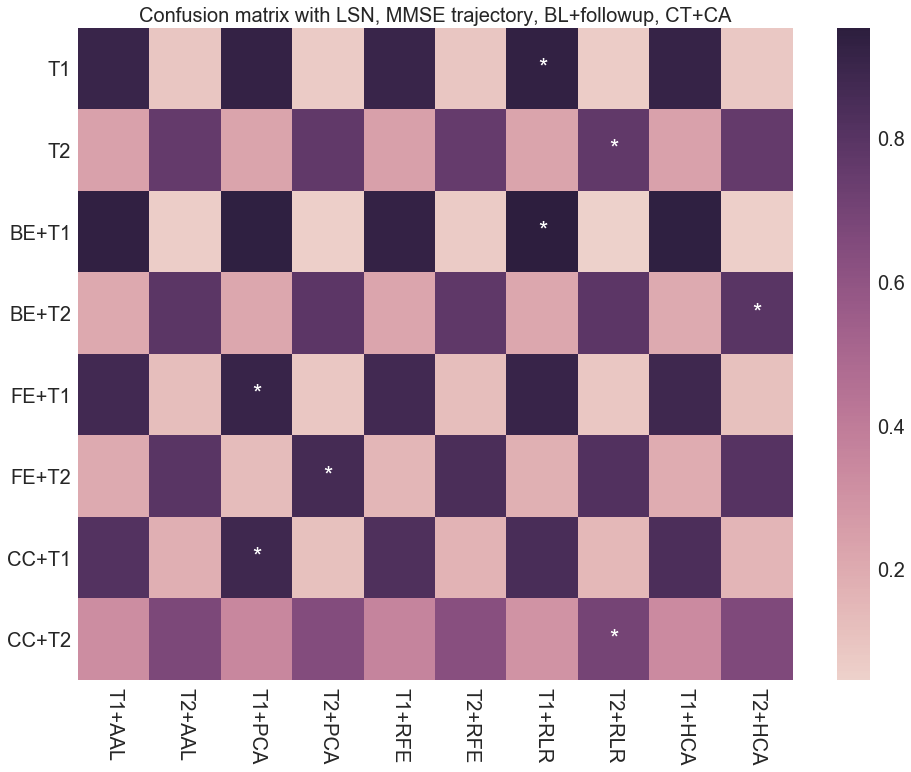

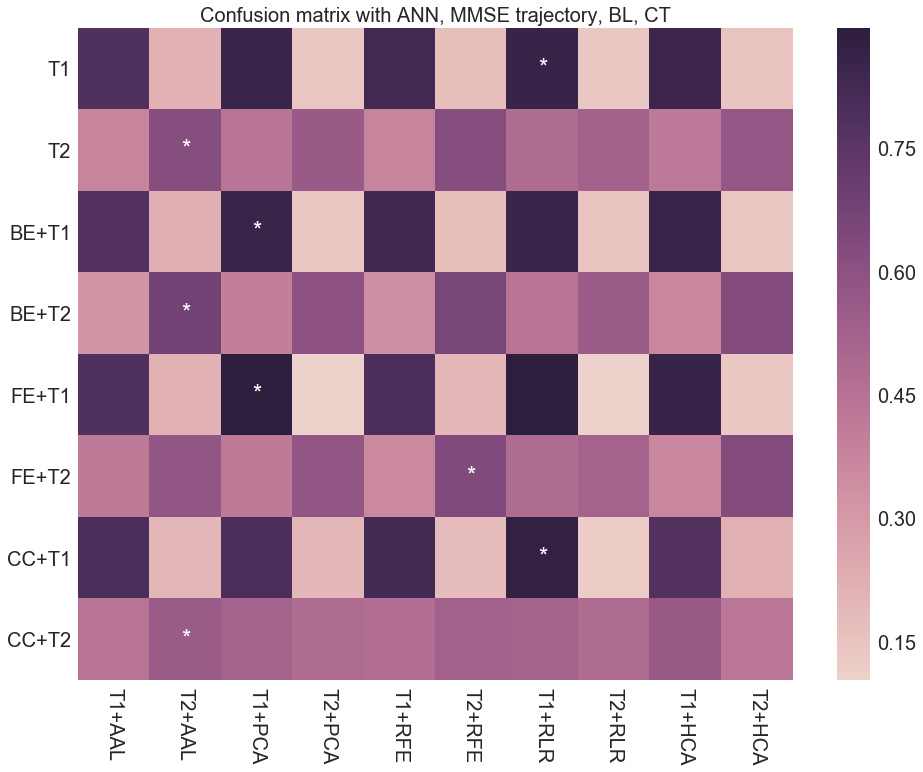

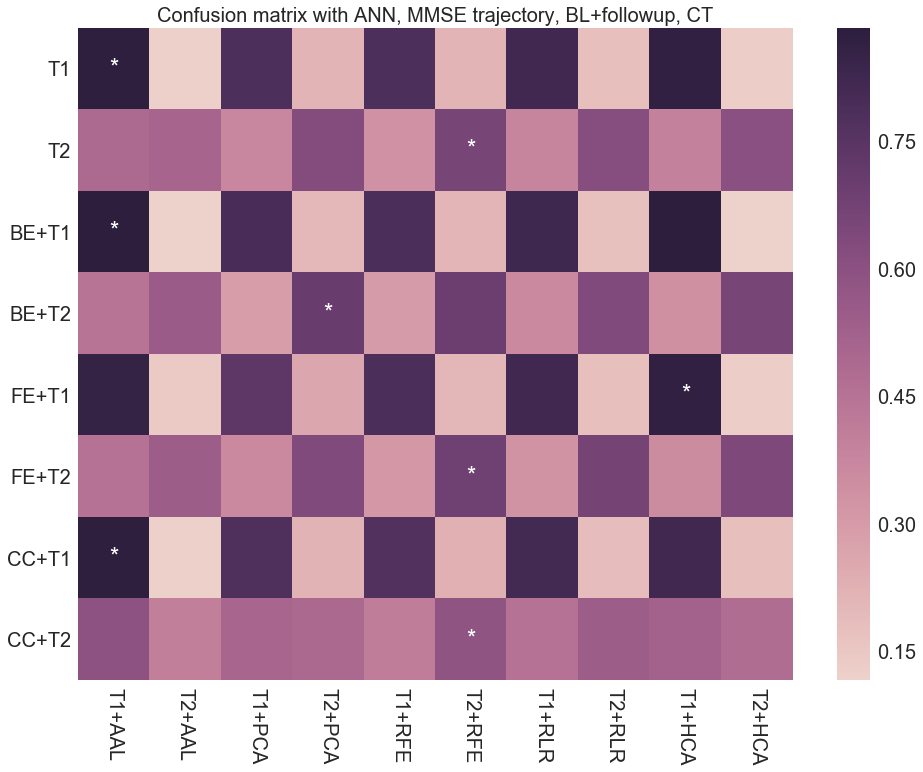

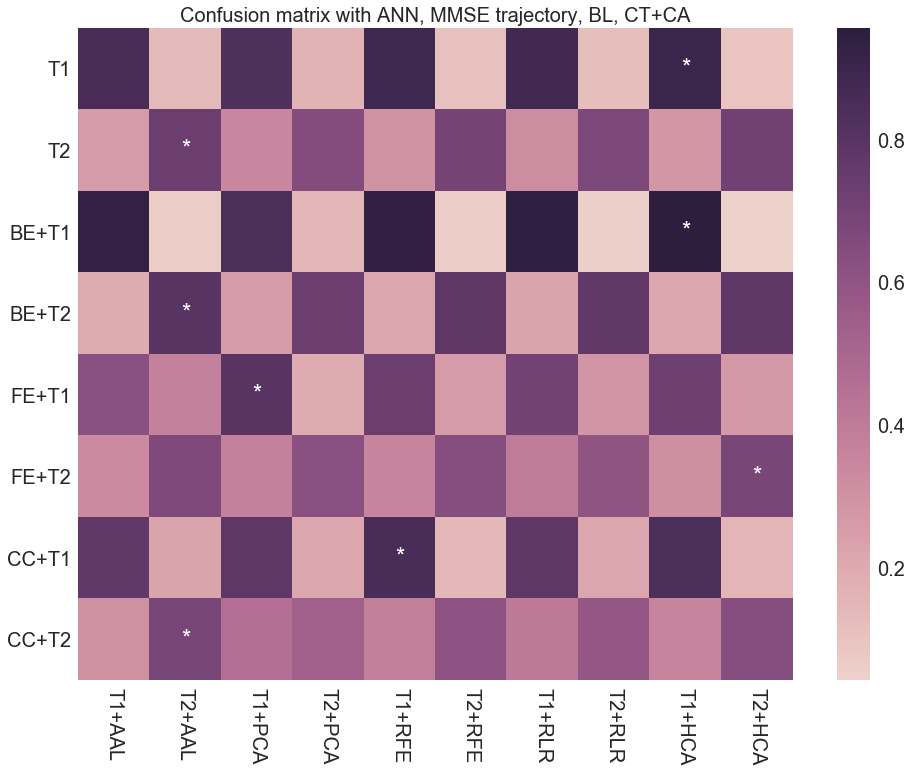

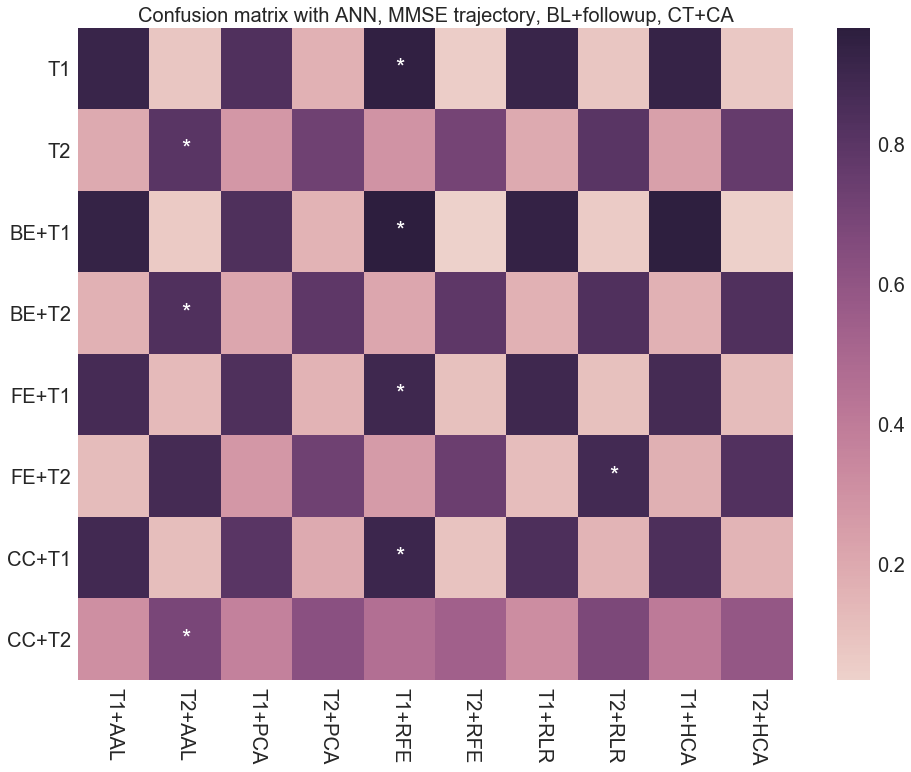

...

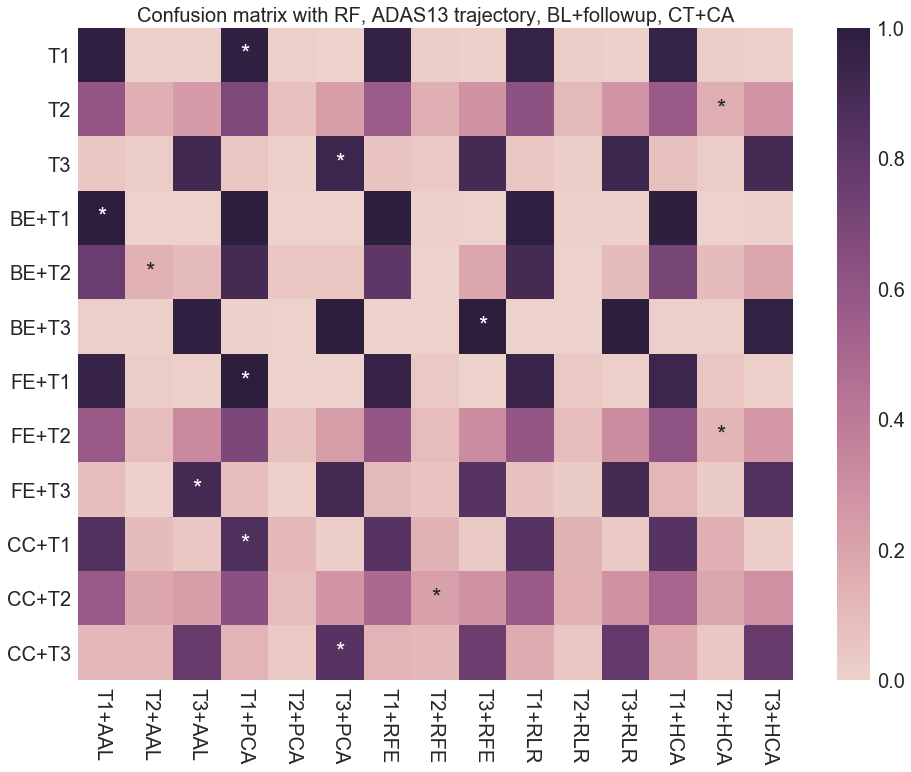

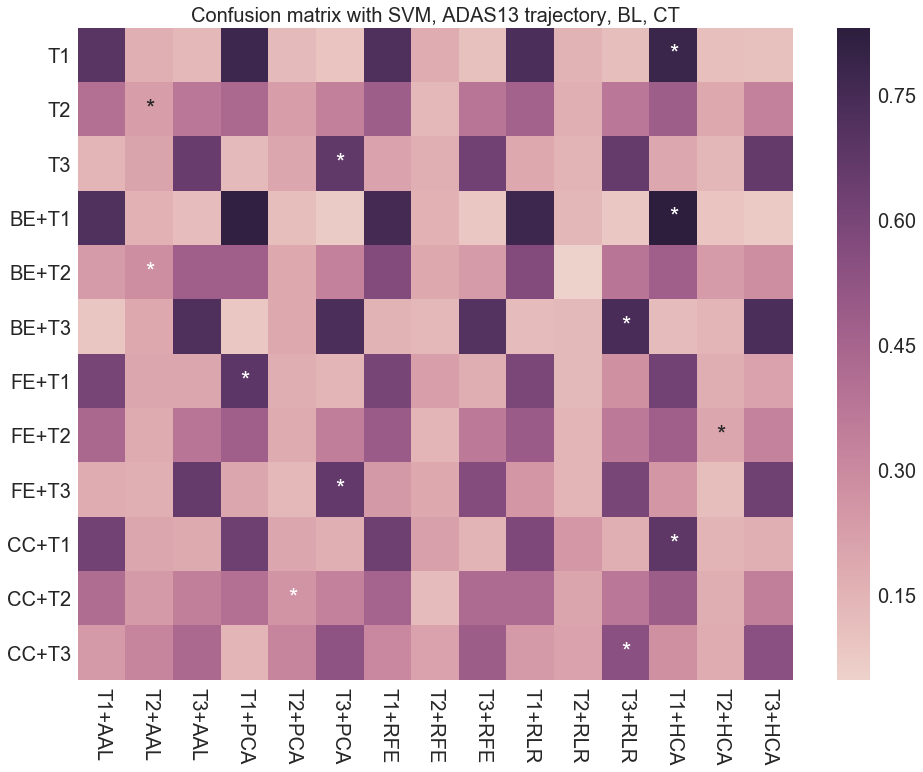

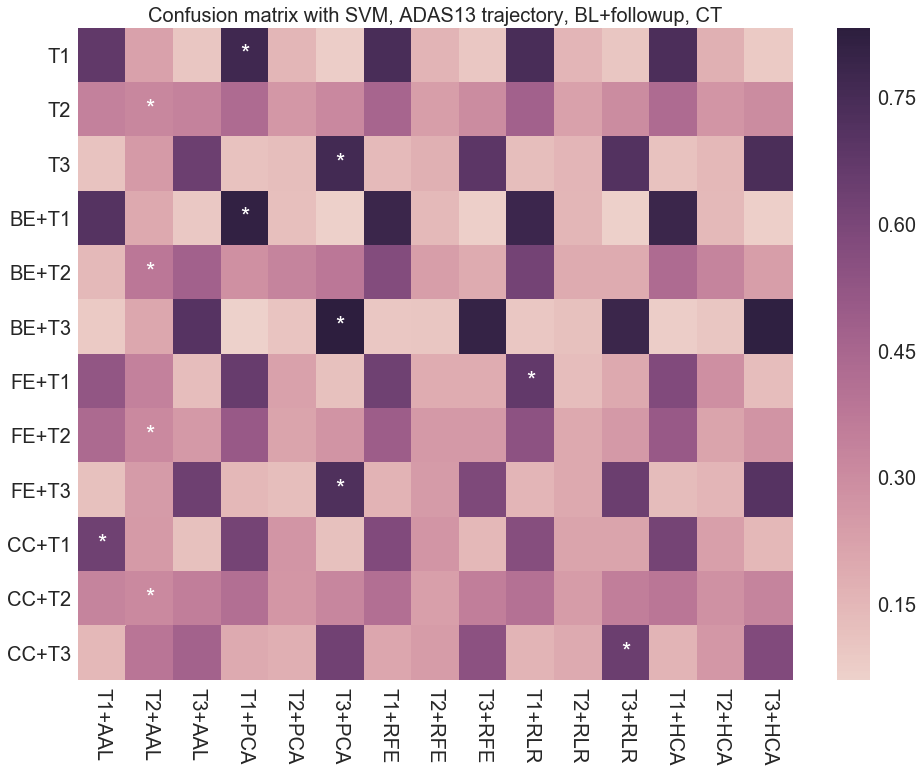

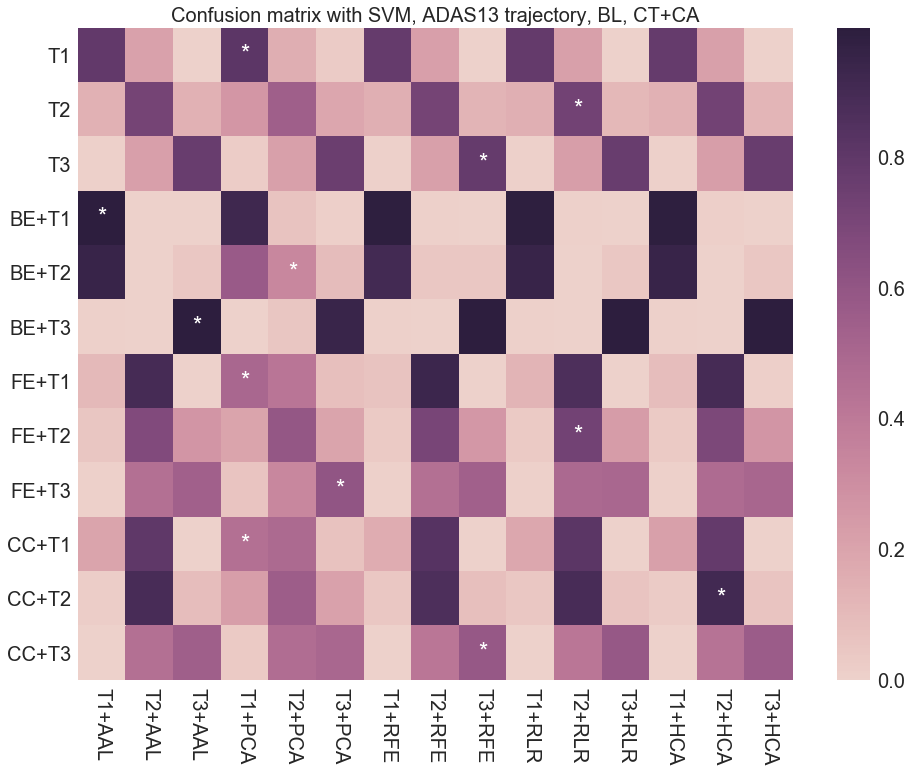

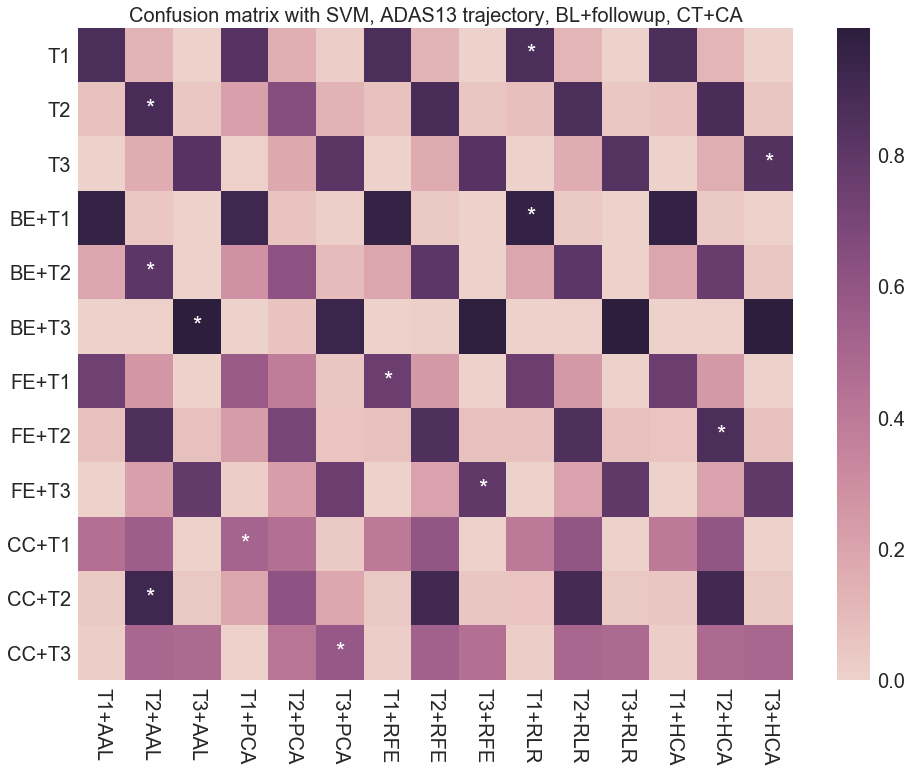

In [87]:
# Plot the confusion heatmaps (subgroup x feature type)

for t in ['MMSE', 'ADAS13']:
    for m in ['LSN', 'ANN', 'LR', 'RF', 'SVM']:
        for ix, condition in enumerate(["BL, CT", "BL+followup, CT", "BL, CT+CA","BL+followup, CT+CA"]):
            if m == "LSN" and condition != "BL+followup, CT+CA":
                pass
            
            else:
                cmatrix = {}
                
                if condition == "BL, CT":
                    suffix = "{}_78_NoClinical_NoFollowup_cmatrix.pkl".format(t)
                elif condition == "BL+followup, CT":
                    suffix = "{}_78_NoClinical_cmatrix.pkl".format(t)
                elif condition == "BL, CT+CA":
                    suffix = "{}_78_NoFollowup_cmatrix.pkl".format(t)
                elif condition == "BL+followup, CT+CA":
                    suffix = "{}_78_cmatrix.pkl".format(t)

                for ftype in ["AAL", "HCA", "PCA", "RFE", "RLR"]:
                    with open("../results/Exp_Mar11/{}_{}_{}".format(m, ftype, suffix), "rb") as f:
                        cmatrix[ftype] = pkl.load(f)
                        
                if t == 'MMSE':
                    increment = 2
                elif t == 'ADAS13':
                    increment = 3
                    
                cmatrix_combined = np.zeros((4*increment, 5*increment))
                
                for i, ftype in enumerate(['AAL', 'PCA', 'RFE', 'RLR', 'HCA']):
                    for j, sg in enumerate(['all', 'BE', 'FE', 'CC']):
                        sub_arr = np.array(cmatrix[ftype][sg])
                        sub_arr = np.average(sub_arr, axis=0)
                        sub_arr = (sub_arr.T / np.sum(sub_arr, axis=1)).T
                        cmatrix_combined[j*increment:(j+1)*increment, i*increment:(i+1)*increment] = sub_arr
                
                if t == 'MMSE':
                    index = ['T1', 'T2', 'BE+T1', 'BE+T2', 'FE+T1', 'FE+T2', 'CC+T1', 'CC+T2']
                    columns = ['T1+AAL', 'T2+AAL', 'T1+PCA', 'T2+PCA', 'T1+RFE', 'T2+RFE', 
                               'T1+RLR', 'T2+RLR', 'T1+HCA', 'T2+HCA']
                elif t == 'ADAS13':
                    index = ['T1', 'T2', 'T3', 'BE+T1', 'BE+T2', 'BE+T3', 
                             'FE+T1', 'FE+T2', 'FE+T3', 'CC+T1', 'CC+T2', 'CC+T3']
                    columns = ['T1+AAL', 'T2+AAL', 'T3+AAL', 'T1+PCA', 'T2+PCA', 'T3+PCA', 'T1+RFE', 'T2+RFE', 
                               'T3+RFE', 'T1+RLR', 'T2+RLR', 'T3+RLR', 'T1+HCA', 'T2+HCA', 'T3+HCA']
                df = pd.DataFrame(cmatrix_combined, index=index, columns=columns)
                
                annotation = np.zeros((4*increment, 5*increment), dtype=np.str)
                for j in range(4*increment):
                    true_pos = cmatrix_combined[j, [i for i in range(5*increment) if i%increment == j%increment]]
                    best_ind = increment*np.argmax(true_pos) + j%increment
                    annotation[j, best_ind] = '*'
                
                plt.figure(figsize=(16,12))
                sns.heatmap(pd.DataFrame(df), annot=annotation, fmt='', cmap=sns.cubehelix_palette(as_cmap=True))
                plt.title("Confusion matrix with {}, {} trajectory, {}".format(m, t, condition), fontsize=20)
                plt.yticks(rotation=0); plt.xticks(rotation=270);
                plt.savefig("../plots/Exp_Mar11/{}_{}_{}_cmatrix.png".format(m, t, ix))

In [88]:
# Read the replication study data
df = pd.read_csv("../results/Exp_Mar11/replication_performance.csv")
choices = ["BL, CT", "BL+followup, CT", "BL, CT+CA","BL+followup, CT+CA"]
sns.set(font_scale=2)

# Reformat the obtained results
new_df = pd.DataFrame()
for index, row in df.iterrows():
    if row["Method"] != "LSN" and not row["NoThickness"]:
        if row["NoClinical"] and row["NoFollowup"]:
            condition = "BL, CT"
        elif row["NoClinical"]:
            condition = "BL+followup, CT"
        elif row["NoFollowup"]:
            condition = "BL, CT+CA"
        else:
            condition = "BL+followup, CT+CA"
        method = row["Method"]
        featuretype = row["FeatureType"]
        
        for i in range(10):
            accuracy = row["acc_{}".format(i)]
            my_auc = row["auc_{}".format(i)]
            new_row = {"Method": method, "Input Type": condition,
                       "FeatureType": featuretype, "Accuracy": accuracy, "AUC": my_auc}
            new_df = new_df.append(new_row, ignore_index=True)

# Append the results with the LSN method
for index, row in df.iterrows():
    if row["Method"] == "LSN":
        condition = "BL+followup, CT+CA"
        method = row["Method"]
        featuretype = row["FeatureType"]
        
        for i in range(10):
            accuracy = row["acc_{}".format(i)]
            my_auc = row["auc_{}".format(i)]
            new_row = {"Method": method, "Input Type": condition,
                       "FeatureType": featuretype, "Accuracy": accuracy, "AUC": my_auc}
            new_df = new_df.append(new_row, ignore_index=True)
            
# Append the results with clinical attributes only
for index, row in df.iterrows():
    if row["NoThickness"]:
        if row["NoFollowup"]:
            condition = "BL, CA"
        else:
            condition = "BL+followup, CA"
        method = row["Method"]
        featuretype = row["FeatureType"]
        
        for i in range(10):
            accuracy = row["acc_{}".format(i)]
            my_auc = row["auc_{}".format(i)]
            new_row = {"Method": method, "Input Type": condition,
                       "FeatureType": featuretype, "Accuracy": accuracy, "AUC": my_auc}
            new_df = new_df.append(new_row, ignore_index=True)

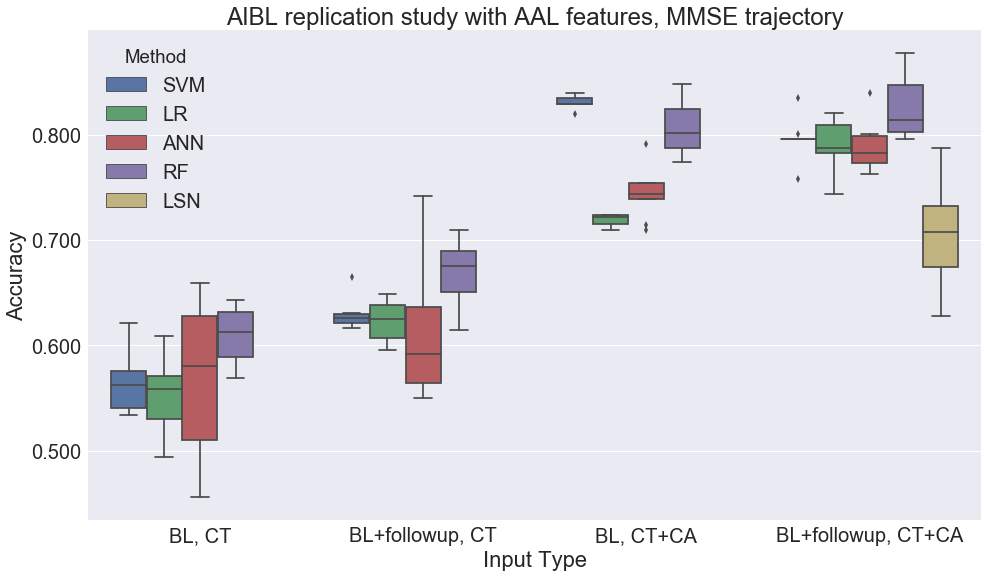

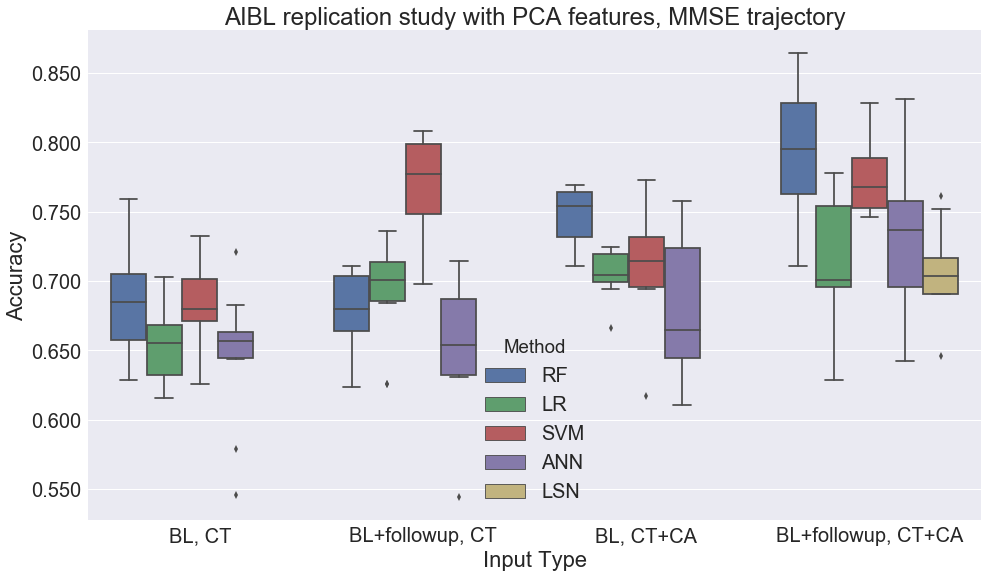

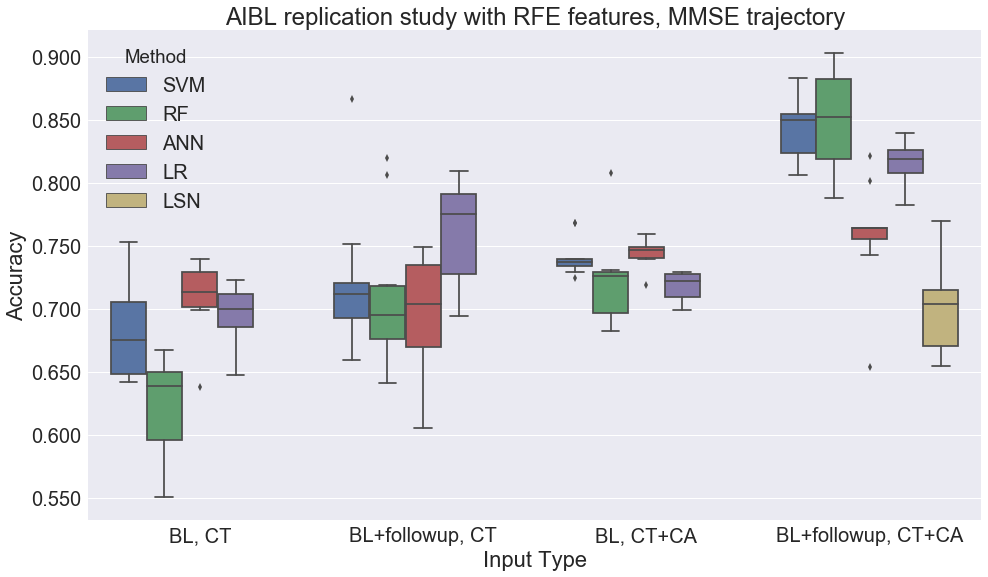

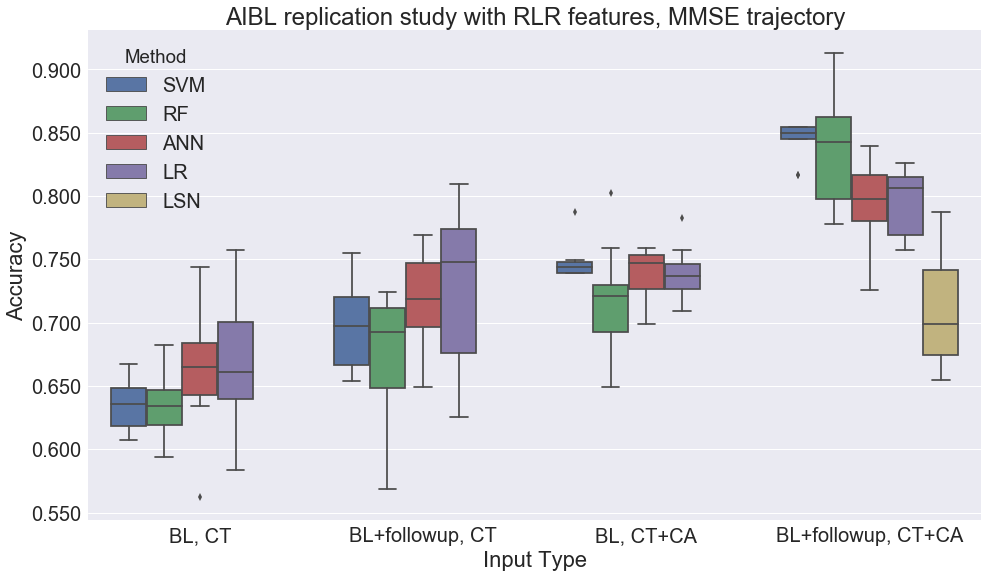

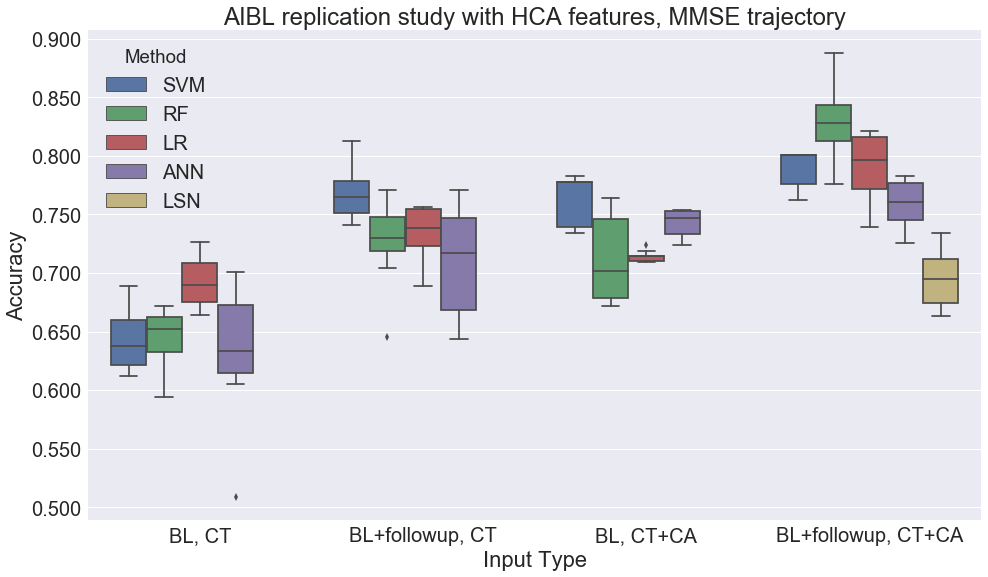

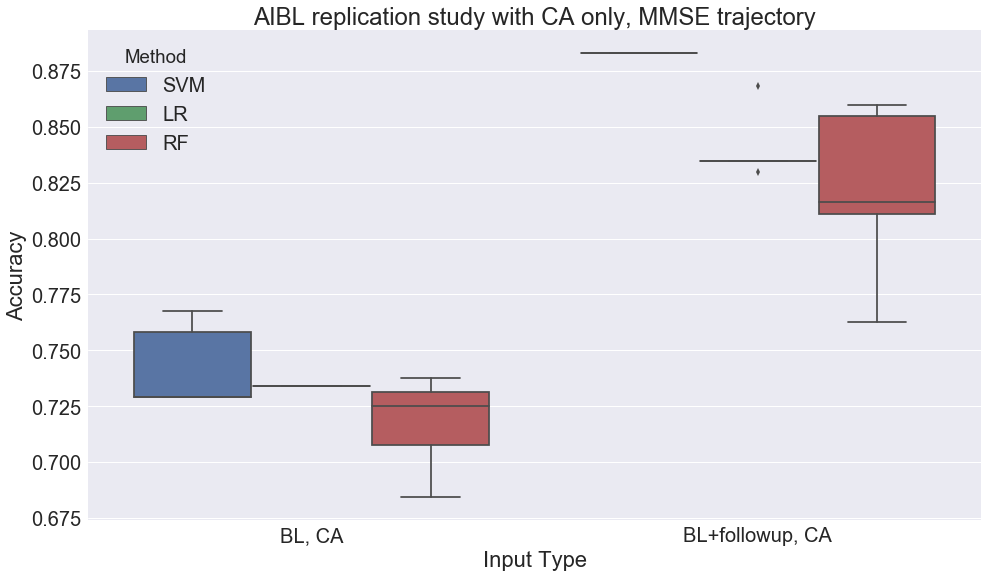

In [89]:
# Look through the experimental conditions (accuracy)
for f in ["AAL", "PCA", "RFE", "RLR", "HCA"]:
    plt.figure(figsize=(16,9))
    cur_df = new_df.loc[new_df["FeatureType"] == f]
    ax = sns.boxplot(x="Input Type", y="Accuracy", hue="Method", data=cur_df, order=choices)
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
    plt.title("AIBL replication study with {} features, MMSE trajectory".format(f))
    plt.savefig("../plots/Exp_Mar11/AIBL_{}_acc_boxplot.png".format(f))
    
# Plot the accuracy with clinical attributes only
plt.figure(figsize=(16,9))
cur_df = new_df.loc[new_df["FeatureType"] == "None"]
ax = sns.boxplot(x="Input Type", y="Accuracy", hue="Method", data=cur_df, 
                 order=["BL, CA", "BL+followup, CA"])
ax.yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
plt.title("AIBL replication study with CA only, MMSE trajectory")
plt.savefig("../plots/Exp_Mar11/AIBL_CA-only_acc_boxplot.png")

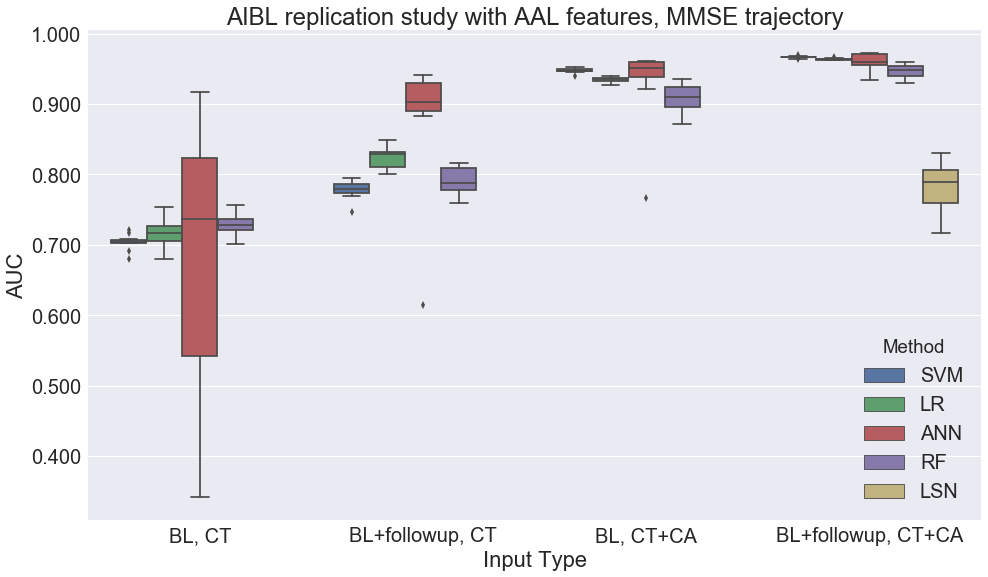

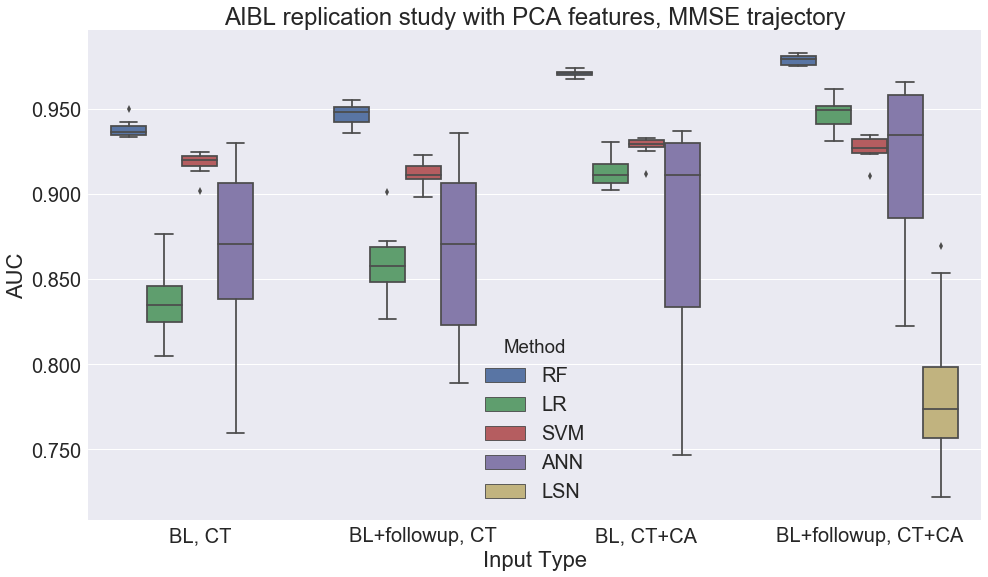

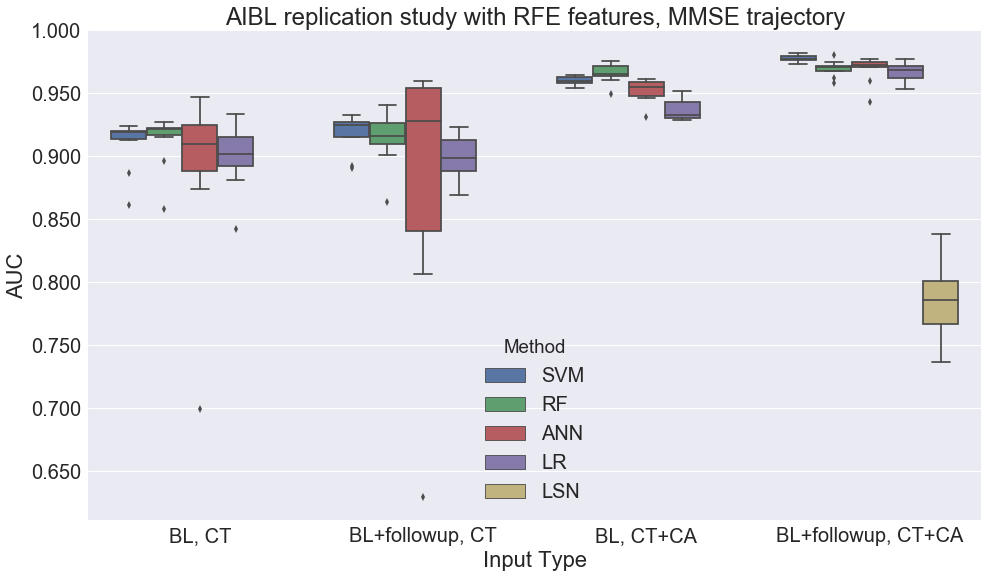

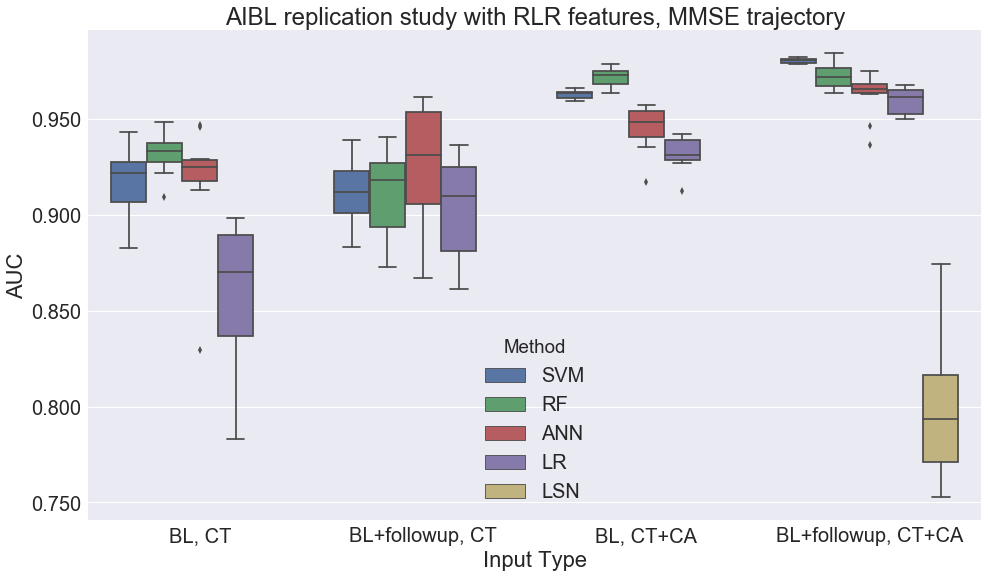

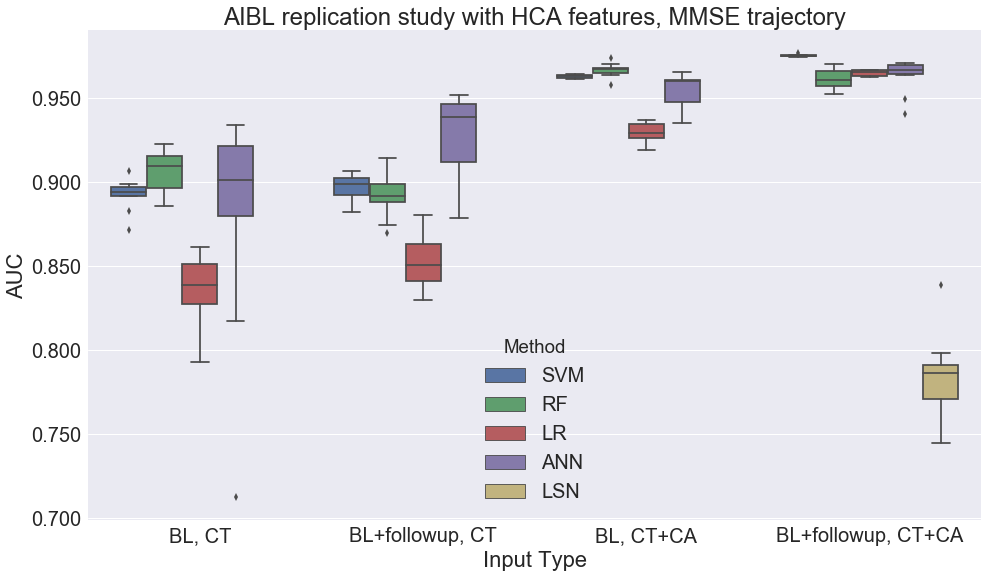

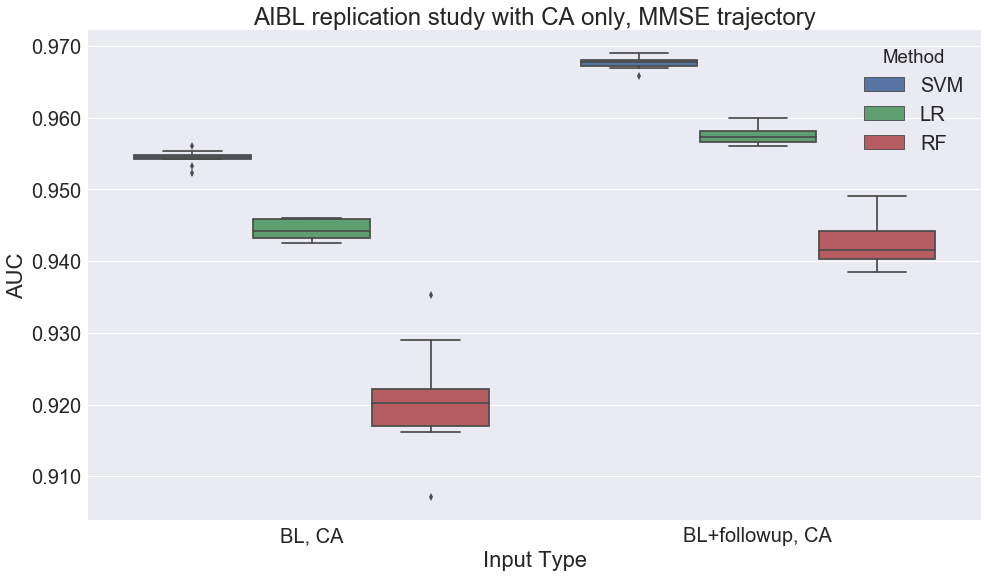

In [90]:
# Look through the experimental conditions (AUC)
for f in ["AAL", "PCA", "RFE", "RLR", "HCA"]:
    plt.figure(figsize=(16,9))
    cur_df = new_df.loc[new_df["FeatureType"] == f]
    ax = sns.boxplot(x="Input Type", y="AUC", hue="Method", data=cur_df, order=choices)
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
    plt.title("AIBL replication study with {} features, MMSE trajectory".format(f))
    plt.savefig("../plots/Exp_Mar11/AIBL_{}_auc_boxplot.png".format(f))
    
# Plot the AUC with clinical attributes only
plt.figure(figsize=(16,9))
cur_df = new_df.loc[new_df["FeatureType"] == "None"]
ax = sns.boxplot(x="Input Type", y="AUC", hue="Method", data=cur_df, 
                 order=["BL, CA", "BL+followup, CA"])
ax.yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
plt.title("AIBL replication study with CA only, MMSE trajectory")
plt.savefig("../plots/Exp_Mar11/AIBL_CA-only_auc_boxplot.png")

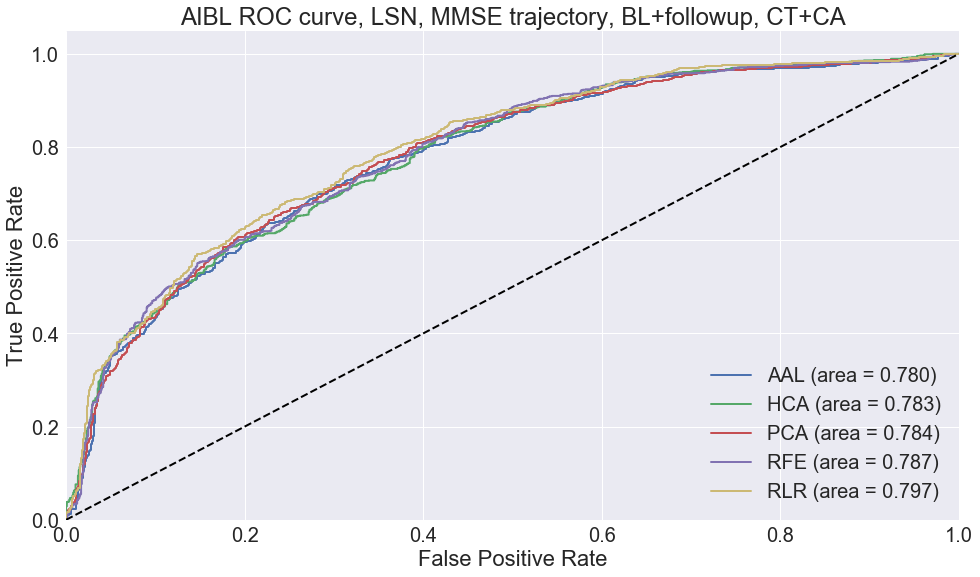

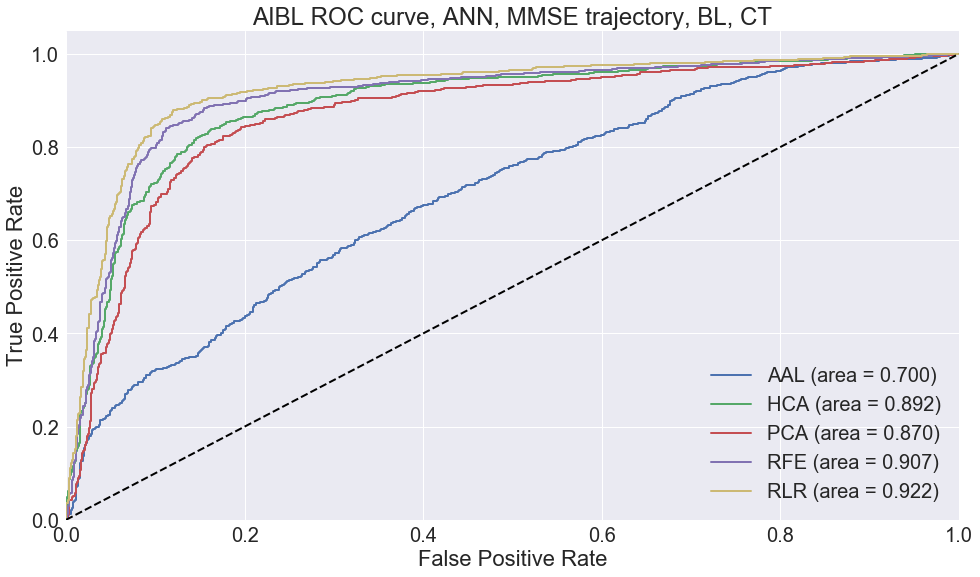

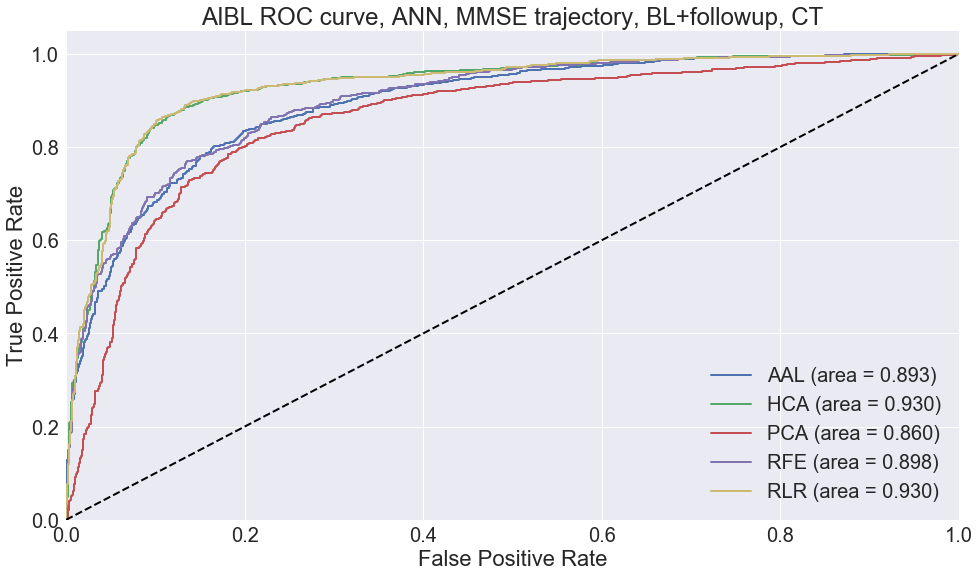

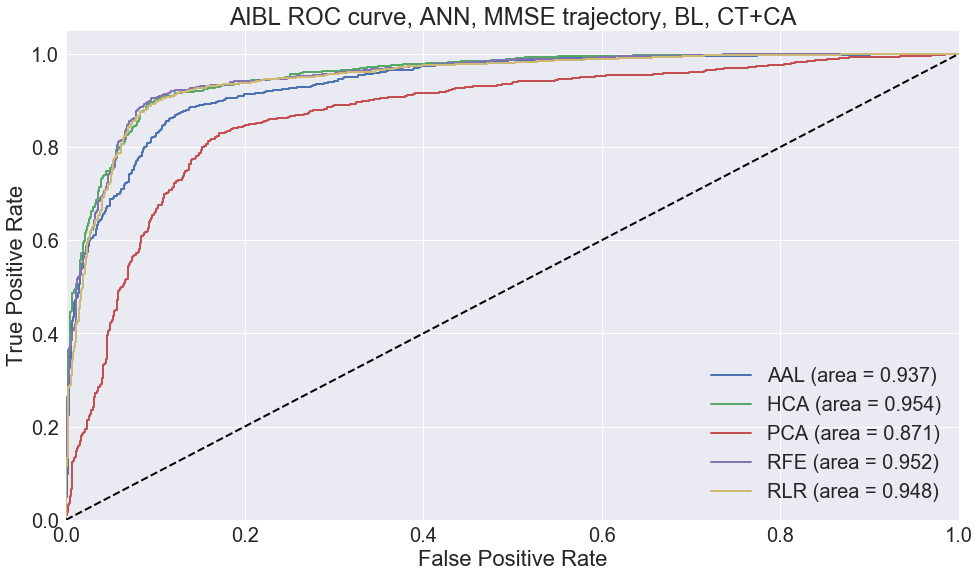

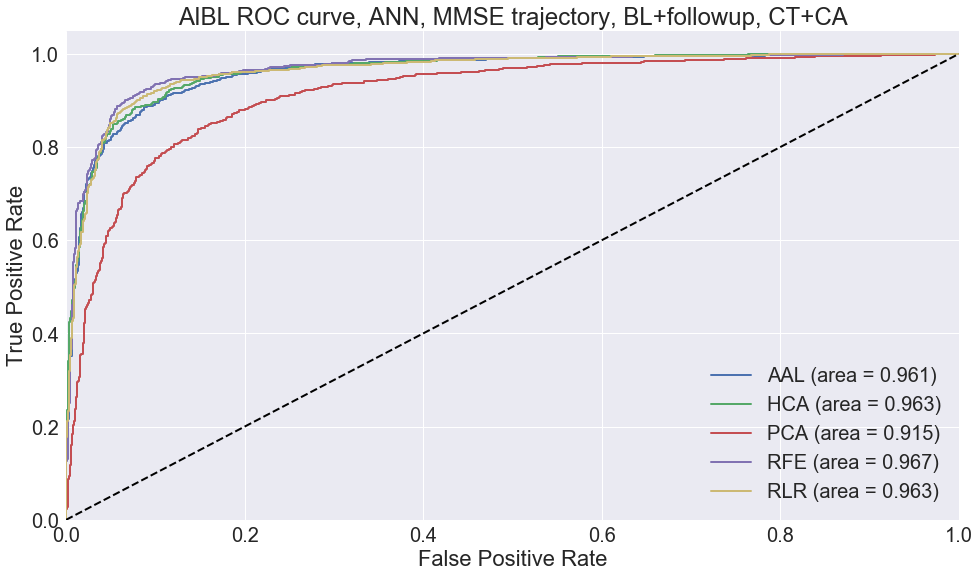

...

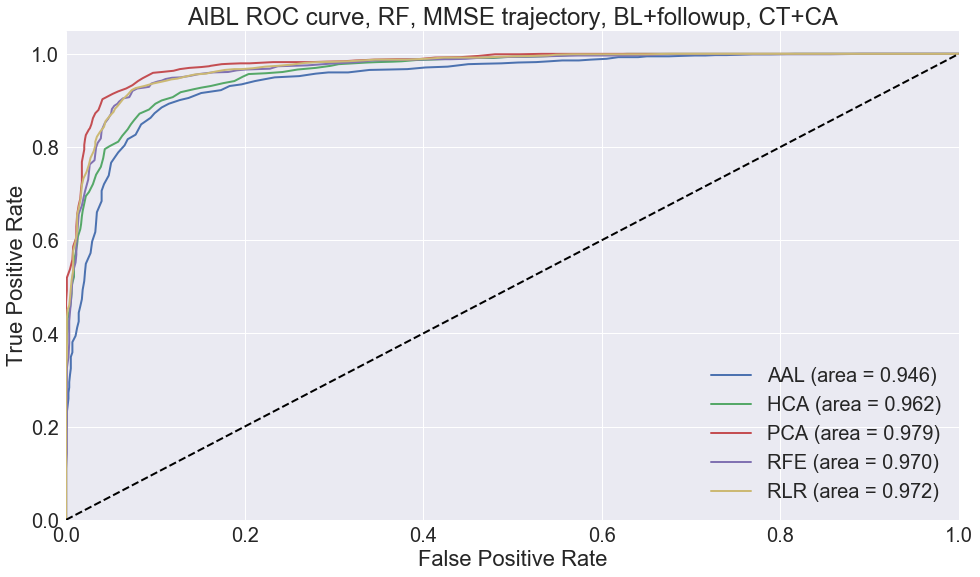

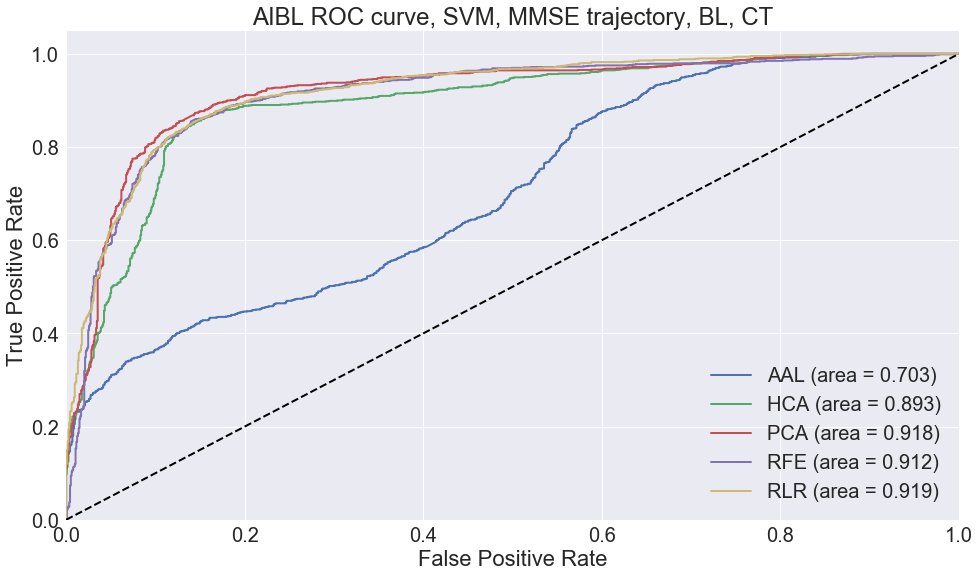

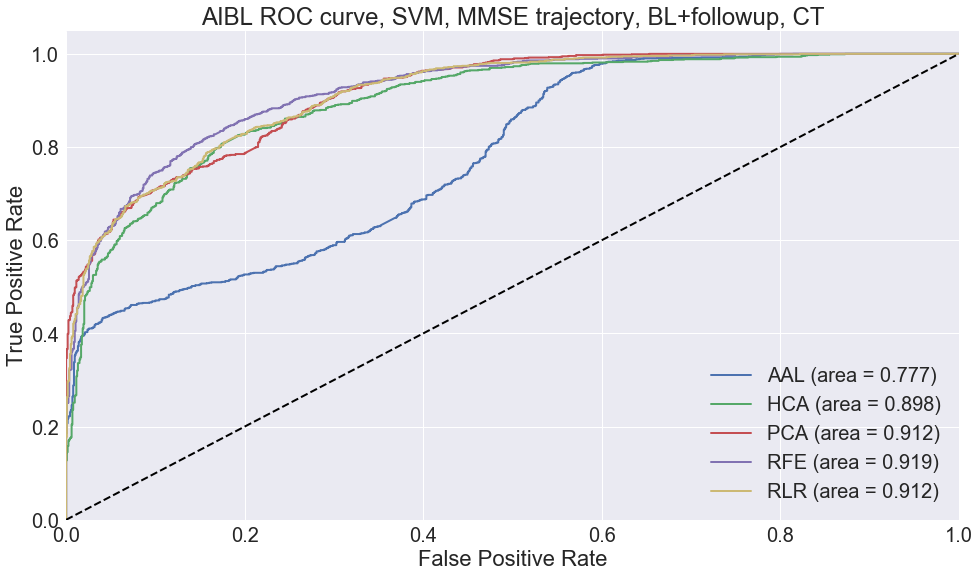

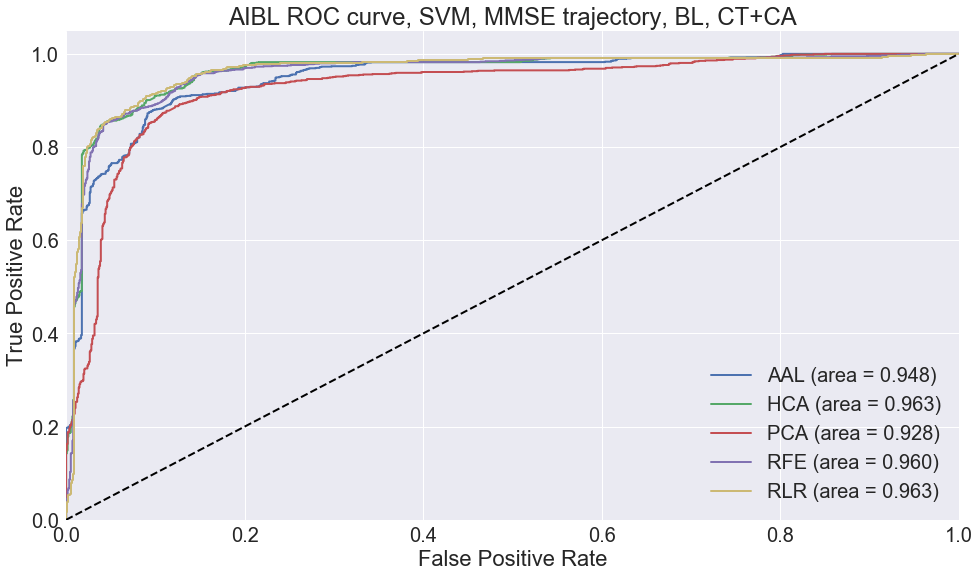

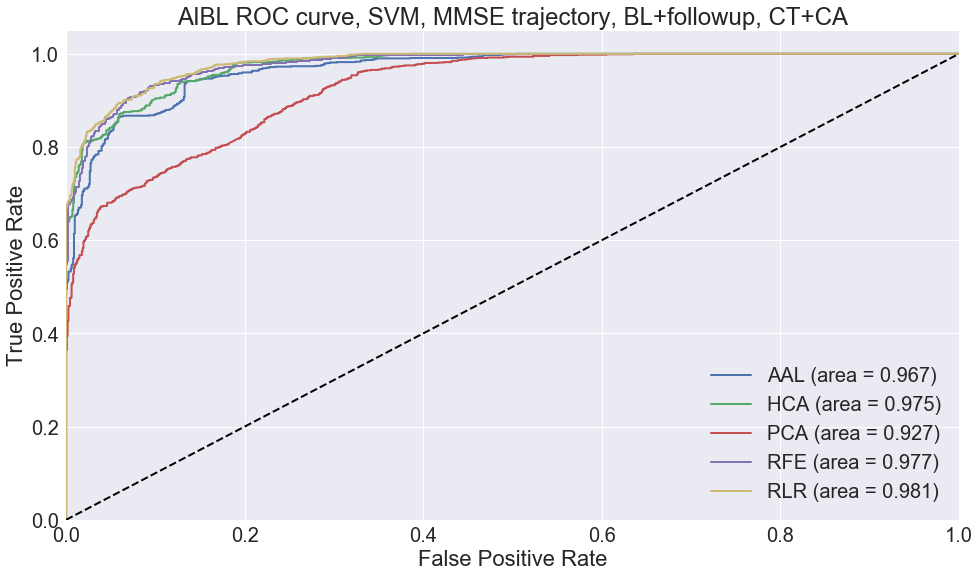

In [91]:
# Plot the Receiver Operator Characteristic curves


for m in ["LSN", "ANN", "LR", "RF", "SVM"]:
    for ix, condition in enumerate(["BL, CT", "BL+followup, CT", "BL, CT+CA","BL+followup, CT+CA"]):
        if m == "LSN" and condition != "BL+followup, CT+CA":
            pass

        else:
            roc_stats = {}

            if condition == "BL, CT":
                suffix = "MMSE_78_NoClinical_NoFollowup_aibl_roc_stats.pkl"
            elif condition == "BL+followup, CT":
                suffix = "MMSE_78_NoClinical_aibl_roc_stats.pkl"
            elif condition == "BL, CT+CA":
                suffix = "MMSE_78_NoFollowup_aibl_roc_stats.pkl"
            elif condition == "BL+followup, CT+CA":
                suffix = "MMSE_78_aibl_roc_stats.pkl"

            for ftype in ["AAL", "HCA", "PCA", "RFE", "RLR"]:
                with open("../results/Exp_Mar11/{}_{}_{}".format(m, ftype, suffix), "rb") as f:
                    roc_stats[ftype] = pkl.load(f)

            plt.figure(figsize=(16,9))
            for ftype in ["AAL", "HCA", "PCA", "RFE", "RLR"]:
                plt.plot(roc_stats[ftype]['fpr'], roc_stats[ftype]['tpr'],
                        lw=2, label="{} (area = {:0.3f})".format(ftype, 
                        auc(roc_stats[ftype]['fpr'], roc_stats[ftype]['tpr'])))

            plt.plot([0, 1], [0, 1], 'k--', lw=2)
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title('AIBL ROC curve, {}, MMSE trajectory, {}'.format(m, condition))
            plt.legend(loc="lower right")
            plt.savefig("../plots/Exp_Mar11/AIBL_{}_{}_ROC_curve.png".format(m, ix))

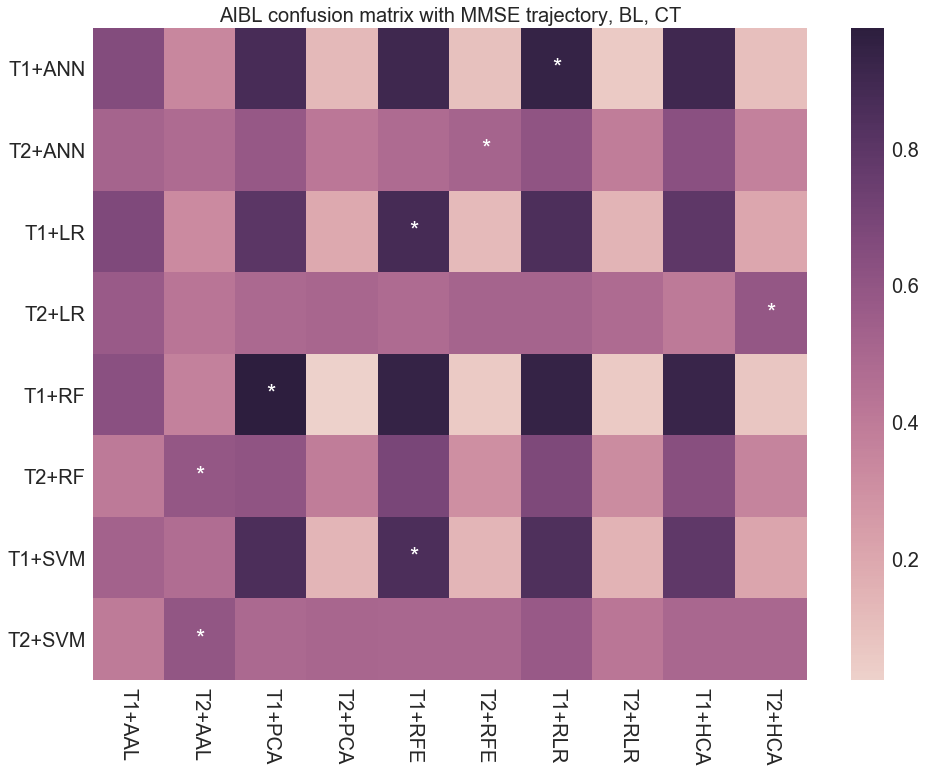

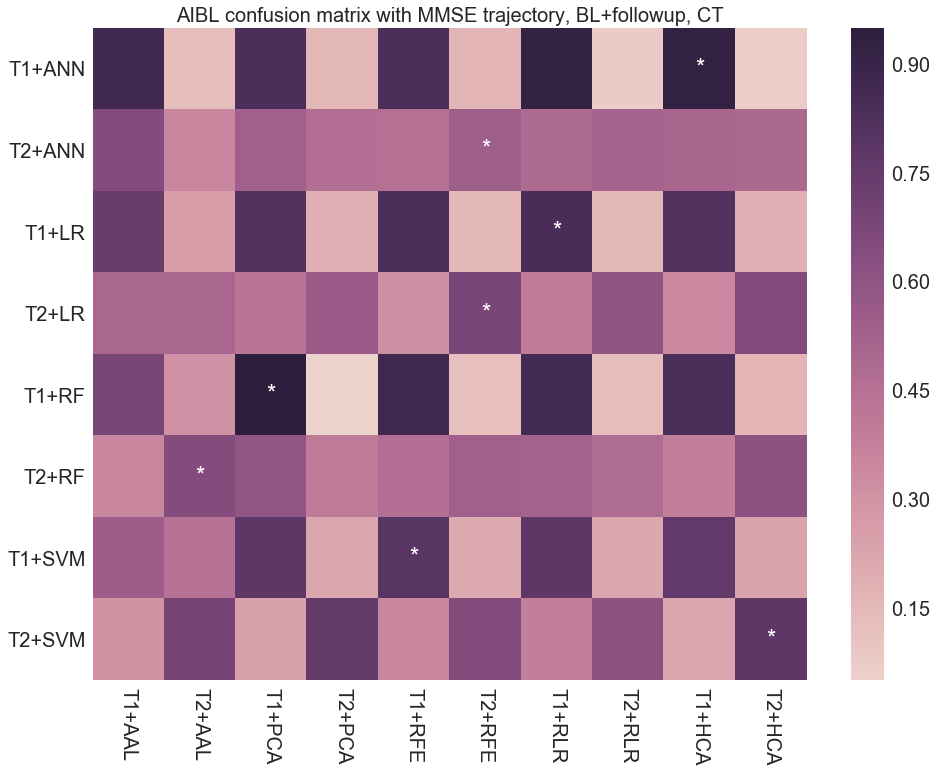

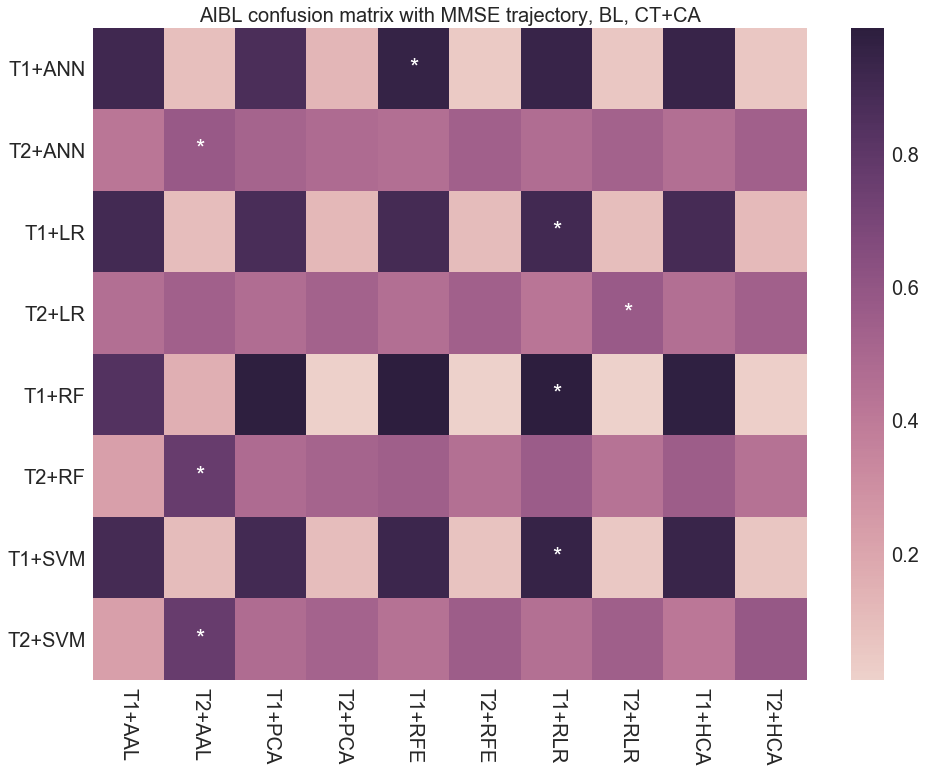

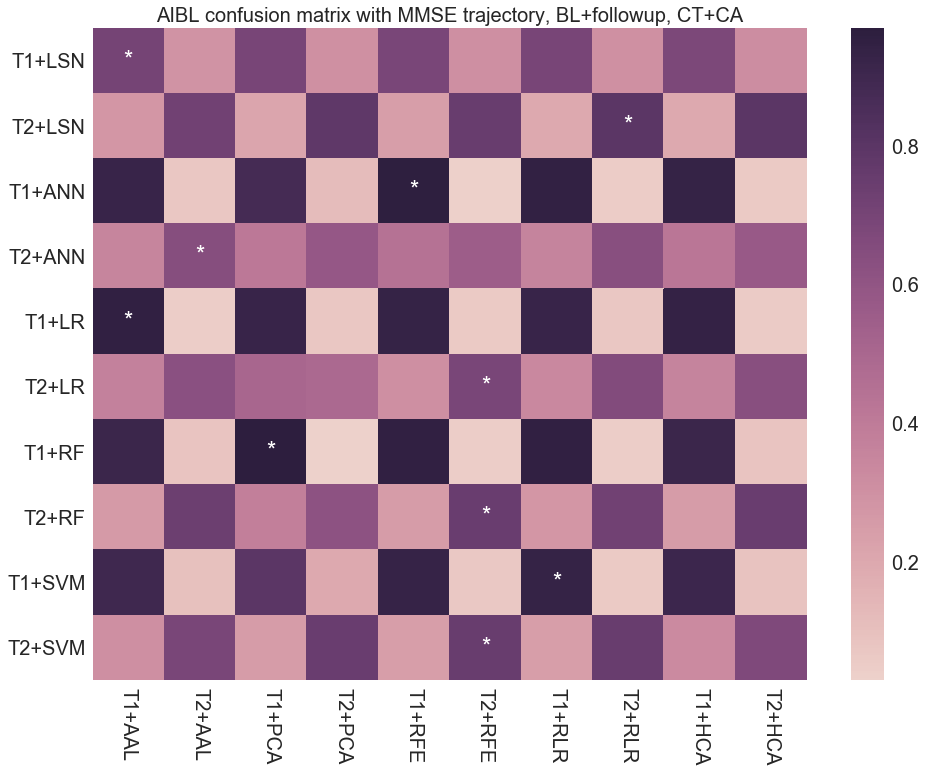

In [92]:
# Plot the confusion heatmaps (subgroup x feature type)

for ix, condition in enumerate(["BL, CT", "BL+followup, CT", "BL, CT+CA","BL+followup, CT+CA"]):

    if condition == "BL+followup, CT+CA":
        methods = ['LSN', 'ANN', 'LR', 'RF', 'SVM']
    else:
        methods = ['ANN', 'LR', 'RF', 'SVM']

    cmatrix = {'AAL': {}, 'HCA': {}, 'PCA': {}, 'RFE': {}, 'RLR': {}}

    if condition == "BL, CT":
        suffix = "MMSE_78_NoClinical_NoFollowup_aibl_cmatrix.pkl"
    elif condition == "BL+followup, CT":
        suffix = "MMSE_78_NoClinical_aibl_cmatrix.pkl"
    elif condition == "BL, CT+CA":
        suffix = "MMSE_78_NoFollowup_aibl_cmatrix.pkl"
    elif condition == "BL+followup, CT+CA":
        suffix = "MMSE_78_aibl_cmatrix.pkl"

    for m in methods:
        for ftype in ["AAL", "HCA", "PCA", "RFE", "RLR"]:
            with open("../results/Exp_Mar11/{}_{}_{}".format(m, ftype, suffix), "rb") as f:
                cmatrix[ftype][m] = pkl.load(f)

    increment = 2    
    cmatrix_combined = np.zeros((len(methods)*increment, 5*increment))

    for i, ftype in enumerate(['AAL', 'PCA', 'RFE', 'RLR', 'HCA']):
        for j, m in enumerate(methods):
            sub_arr = np.array(cmatrix[ftype][m])
            sub_arr = np.average(sub_arr, axis=0)
            sub_arr = (sub_arr.T / np.sum(sub_arr, axis=1)).T
            cmatrix_combined[j*increment:(j+1)*increment, i*increment:(i+1)*increment] = sub_arr

    index = []
    for m in methods:
        index.append('T1+{}'.format(m))
        index.append('T2+{}'.format(m))
    columns = ['T1+AAL', 'T2+AAL', 'T1+PCA', 'T2+PCA', 'T1+RFE', 'T2+RFE', 
               'T1+RLR', 'T2+RLR', 'T1+HCA', 'T2+HCA']
    df = pd.DataFrame(cmatrix_combined, index=index, columns=columns)

    annotation = np.zeros((len(methods)*increment, 5*increment), dtype=np.str)
    for j in range(len(methods)*increment):
        true_pos = cmatrix_combined[j, [i for i in range(5*increment) if i%increment == j%increment]]
        best_ind = increment*np.argmax(true_pos) + j%increment
        annotation[j, best_ind] = '*'

    plt.figure(figsize=(16,12))
    sns.heatmap(pd.DataFrame(df), annot=annotation, fmt='', cmap=sns.cubehelix_palette(as_cmap=True))
    plt.title("AIBL confusion matrix with MMSE trajectory, {}".format(condition), fontsize=20)
    plt.yticks(rotation=0); plt.xticks(rotation=270);
    plt.savefig("../plots/Exp_Mar11/AIBL_{}_cmatrix.png".format(ix))